In [1]:
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd
import h5py
# import cvxpy as cvx
import os

from util import *
# from data_loader import * 
# from module_deconv import *
# from module_exp import *
from sc_deconv import *
from fig_gen import *

%matplotlib inline
%load_ext autoreload
%autoreload 2

/home/martin/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:34: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [2]:
import scanpy.api as sc
from sklearn.preprocessing import normalize
from sklearn.metrics.pairwise import pairwise_distances

sc.settings.verbosity = 3                # increase for more output
sc.settings.set_dpi(100)                  # low pixel number yields small inline figures
sc.logging.print_version_and_date()

Running Scanpy 0.4.2 on 2018-02-20 16:41.


In [3]:
import seaborn as sns

In [4]:
## creating a toy 1d distribution instance
np.random.seed(42)
p,x=toy_dist(vis=1,opt='1d_Q')

TypeError: toy_dist() got an unexpected keyword argument 'vis'

In [ ]:
## generate the simulated read count data
N_c=8000
N_r=38
X,Y,data_info=data_gen_1d(p_hat,dd_info['x'],N_c,N_r,noise='poi',vis=1)

### distribution estimation

In [ ]:
## distribution estimation
# input: Y  
# summary function: Y --> Y_pdf, Y_supp
# specify the scale of x and N_r 

p_hat,dd_info=dd_1d(Y,noise='poi',vis=1,N_r=None)
p_hat_ml,ml_info=ml_1d(Y)
_=plot_result_1d(p_hat,p_hat,p_hat_ml,dd_info,ml_info,data_info)

## 8k PBMC @ 100K rpc

In [5]:
filename_data = '/data/martin/single_cell/filtered_gene_bc_matrices/GRCh38/matrix.mtx'
filename_genes = '/data/martin/single_cell/filtered_gene_bc_matrices/GRCh38/genes.tsv'
filename_barcodes = '/data/martin/single_cell/filtered_gene_bc_matrices/GRCh38/barcodes.tsv'

In [6]:
%%time
adata = sc.read(filename_data, cache=True).transpose()
adata.var_names = np.genfromtxt(filename_genes, dtype=str)[:, 1]
adata.smp_names = np.genfromtxt(filename_barcodes, dtype=str)
sc.logging.print_memory_usage()

Memory usage: current 0.23 GB, difference +0.23 GB
CPU times: user 1.65 s, sys: 249 ms, total: 1.9 s
Wall time: 1.91 s


CST3
Average counts per cell = 7.001789762558167


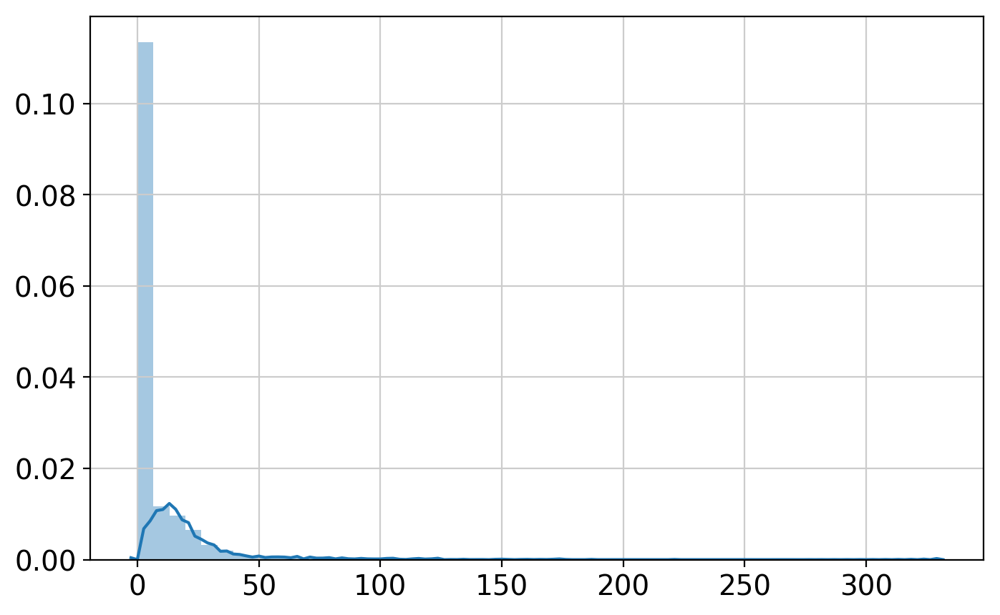

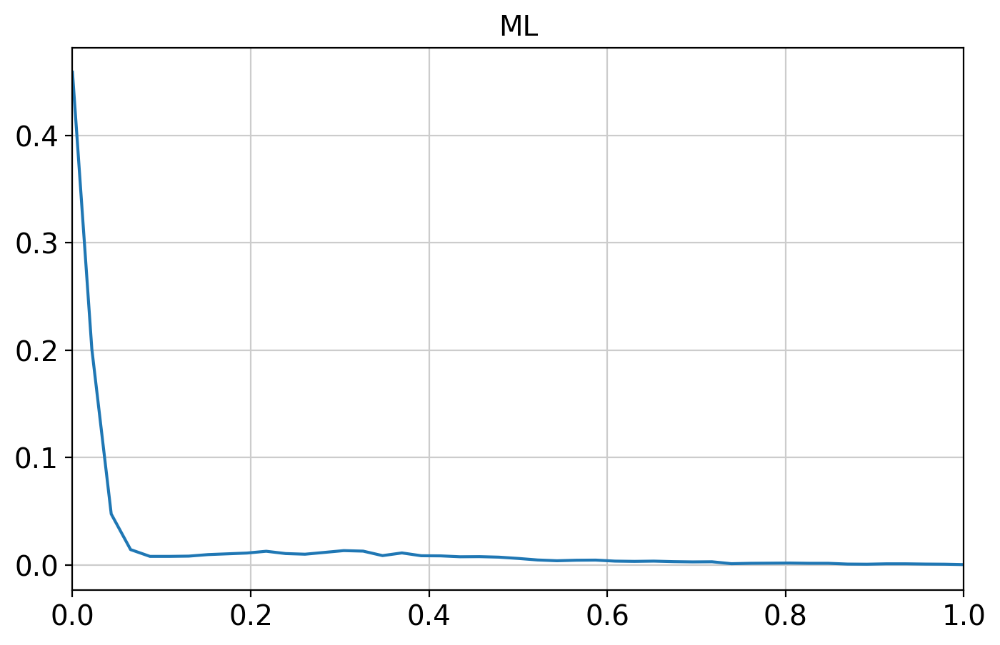

n_degree: 5, c_res: 2, c_reg: 1e-05, gamma: 46

### debug: proportion separation ### start ###


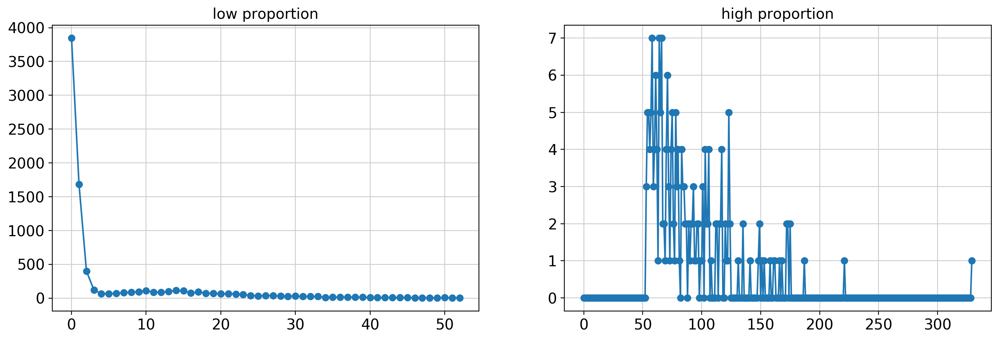

### debug: proportion separation ### end ###

### debug: proportion separation ### start ###
Numerical gradients
0.525126932604536
-0.04226043781585531
-0.16284002457567226
-0.2030872963132424
-0.11703928359807492
Close-form gradients
[ 0.52512696 -0.04226042 -0.16284001 -0.20308727 -0.11703926]
### debug: proportion separation ### end ###

### debug: optimization ### start ###
c_reg 1e-05
-l:2.223854929268721, reg:0.0029284412420628875
### debug: optimization ### end ###

### debug: dd result before merging ### start ###
alpha_hat:  [  4.91505928  -4.6073475   10.21681007 -11.88392529   1.35932971]
gamma:46


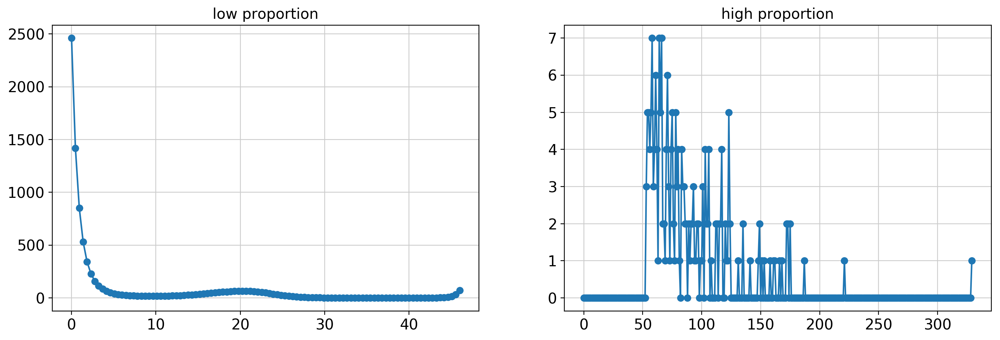

### debug: dd result before merging ### end ###

### debug: dd result after merging ### start ###
gamma:329.0


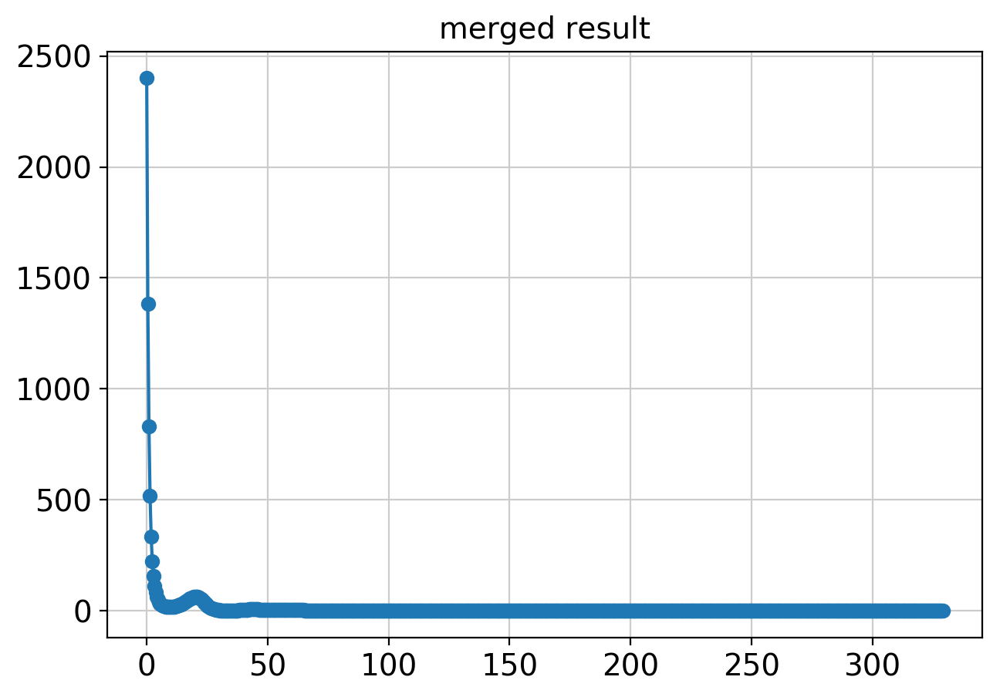

### debug: dd result after merging ### end ###

--- ccdf ---
>0.05: 17.33%
>0.1: 4.123%
>0.15: 2.680%
>0.2: 1.714%
>0.25: 1.119%
>0.3: 0.747%
>0.35: 0.455%
>0.4: 0.279%


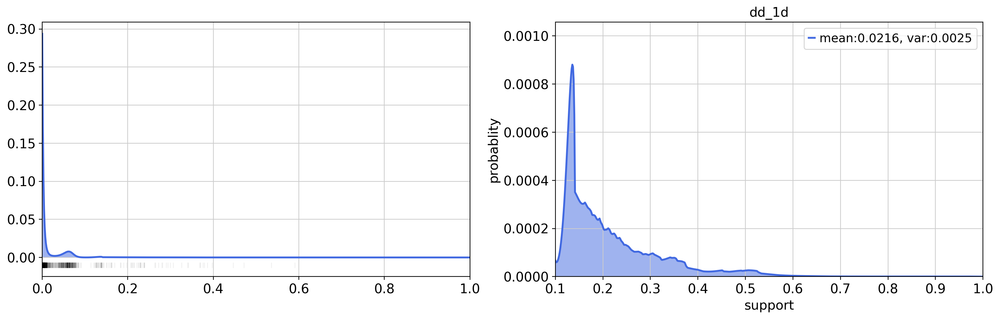

estimated gamma: 329.0
### N_r=469, mean_cts=9, N_c=10000


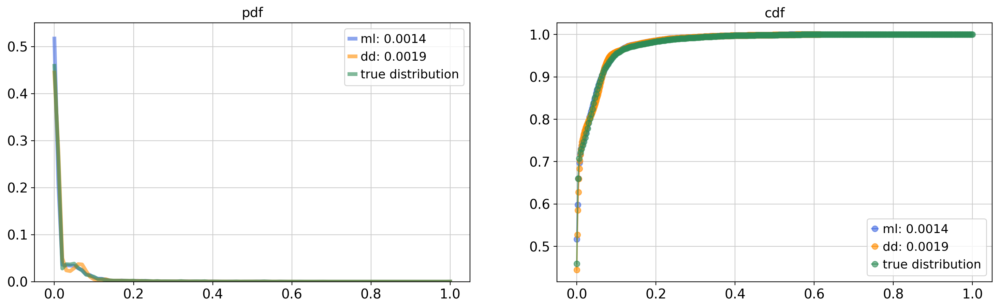



### N_r=4698, mean_cts=99, N_c=1000


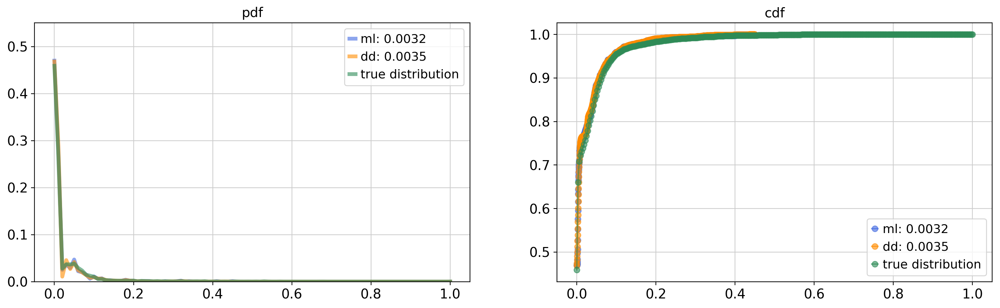

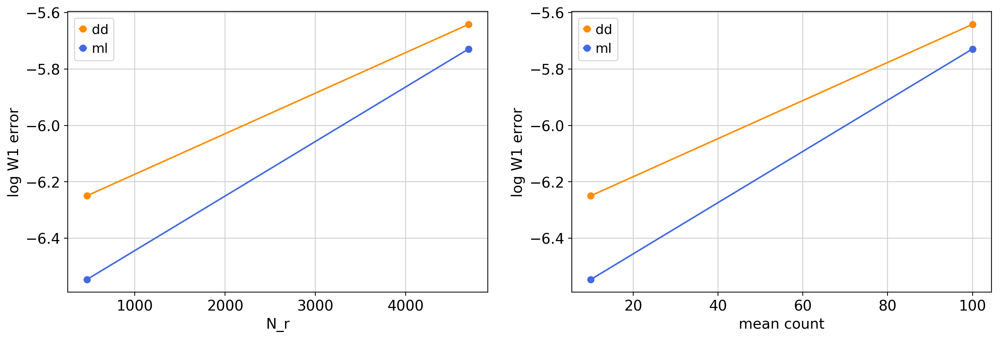

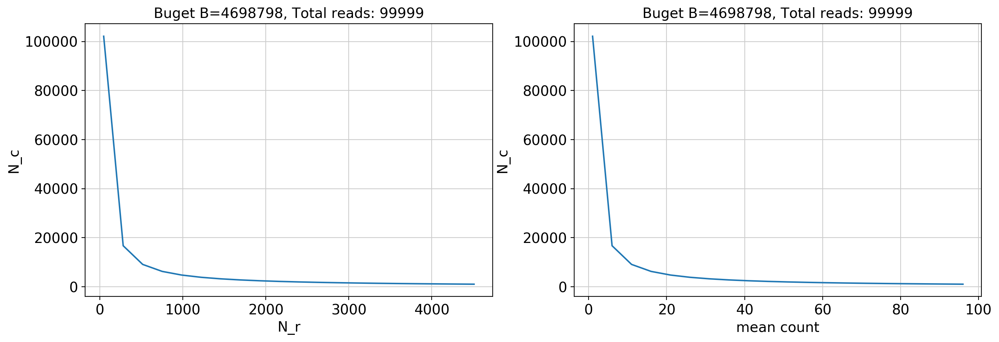

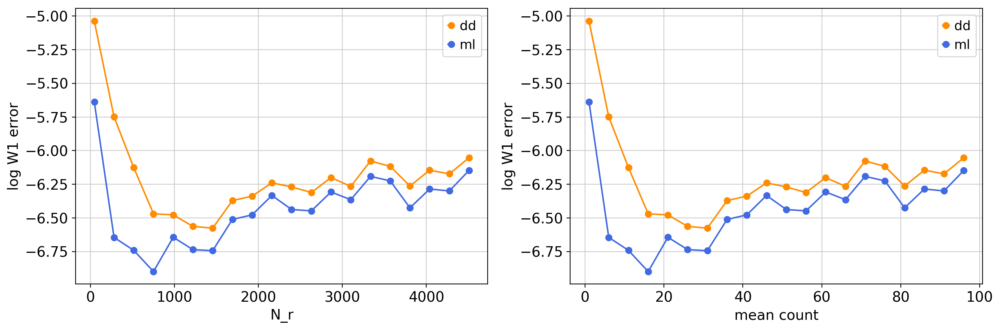

In [7]:
gene='CST3'
Y=np.array(adata[:,gene].X,dtype=int)
print(gene)
print("Average counts per cell =",np.sum(Y)/len(Y))
plt.figure(figsize=[8,5])
sns.distplot(Y)
plt.show()
plt.figure(figsize=[8,5])
p_hat_ml,ml_info=ml_1d(Y)
plt.plot(ml_info['x'],p_hat_ml)
plt.xlim([0,1])
plt.title('ML')
plt.show()

p_hat,dd_info=dd_1d(Y,noise='poi',verbose=1,gamma=None,debug_mode=True)
print("estimated gamma:",dd_info['gamma'])

p_gene,x_gene = counts2pdf_1d(Y)
x_gene = x_gene/x_gene.max()
comparison_1d(p_gene,x_gene,1e5,mean_cts=[10,100],zero_inflate=True)
tradeoff_1d(p_gene,x_gene,1e5)

FTL
Average counts per cell = 27.60064431452094


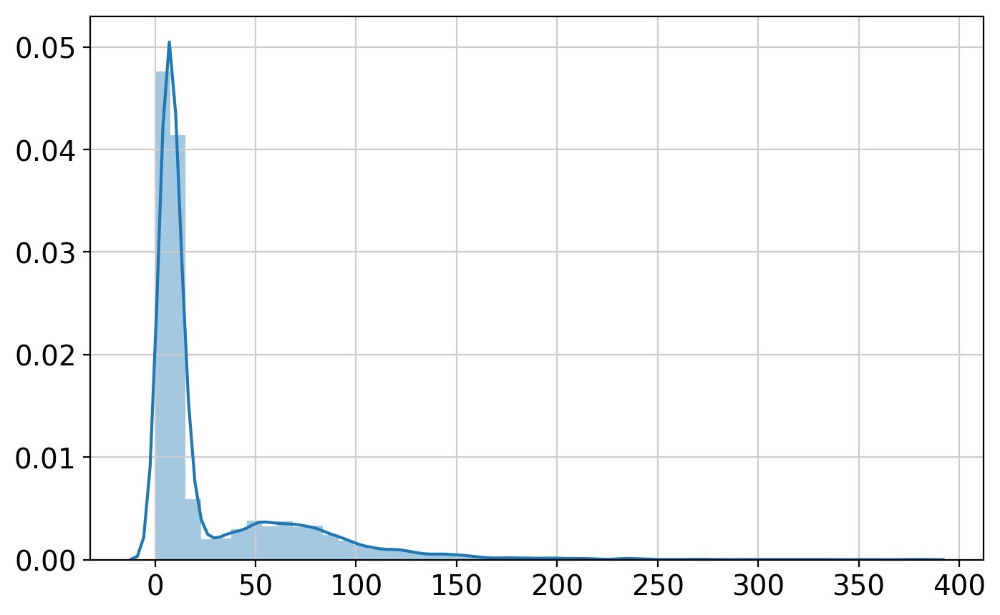

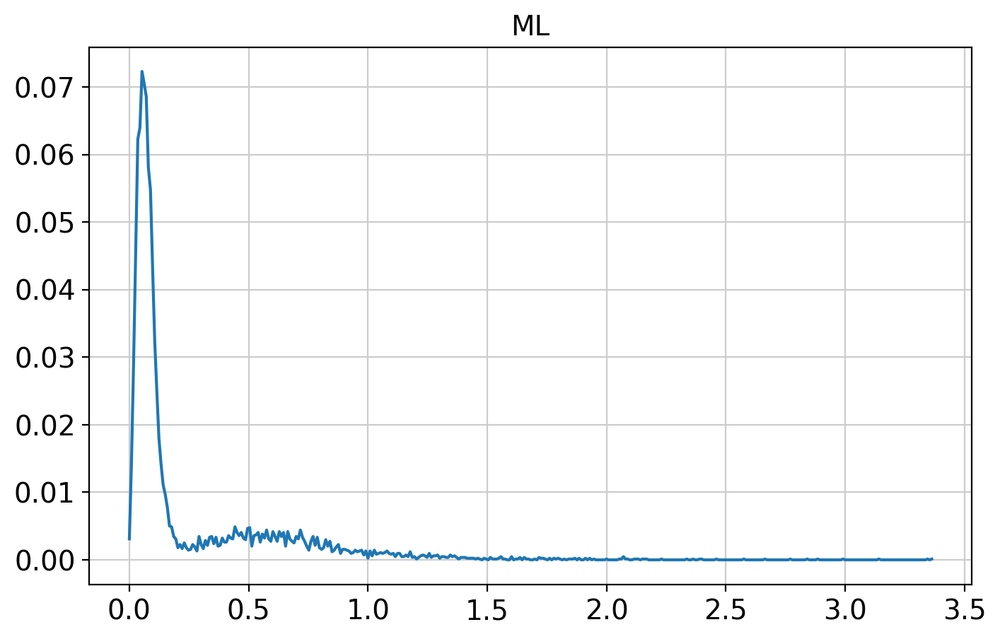

n_degree: 5, c_res: 2, c_reg: 1e-05, gamma: 113

### debug: proportion separation ### start ###


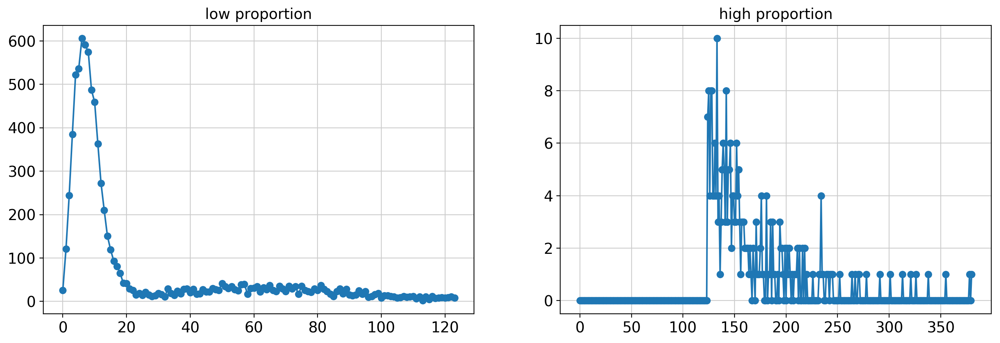

### debug: proportion separation ### end ###

### debug: proportion separation ### start ###
Numerical gradients
0.332271206104906
0.061724680477937
-0.13331529569171607
-0.16493457088984087
-0.09584613636093309
Close-form gradients
[ 0.33227123  0.0617247  -0.13331528 -0.16493455 -0.09584611]
### debug: proportion separation ### end ###

### debug: optimization ### start ###
c_reg 1e-05
-l:4.056760267652305, reg:0.0008341259986410189
### debug: optimization ### end ###

### debug: dd result before merging ### start ###
alpha_hat:  [ 2.81932515  2.84315969 -5.24880401  4.25100773 -4.6647013 ]
gamma:113


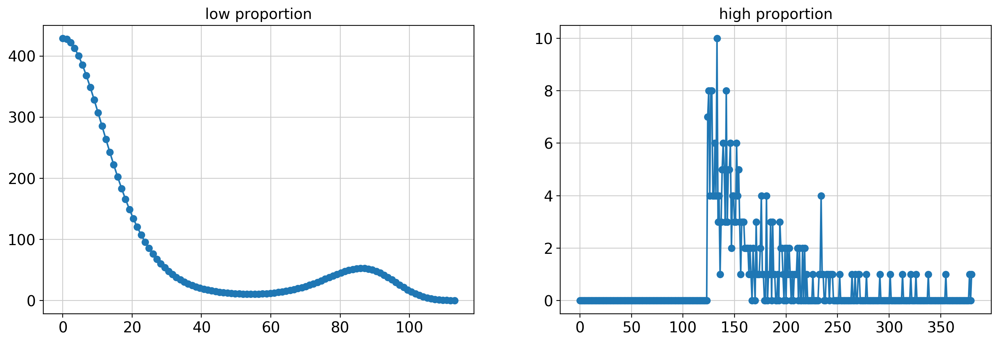

### debug: dd result before merging ### end ###

### debug: dd result after merging ### start ###
gamma:380.0


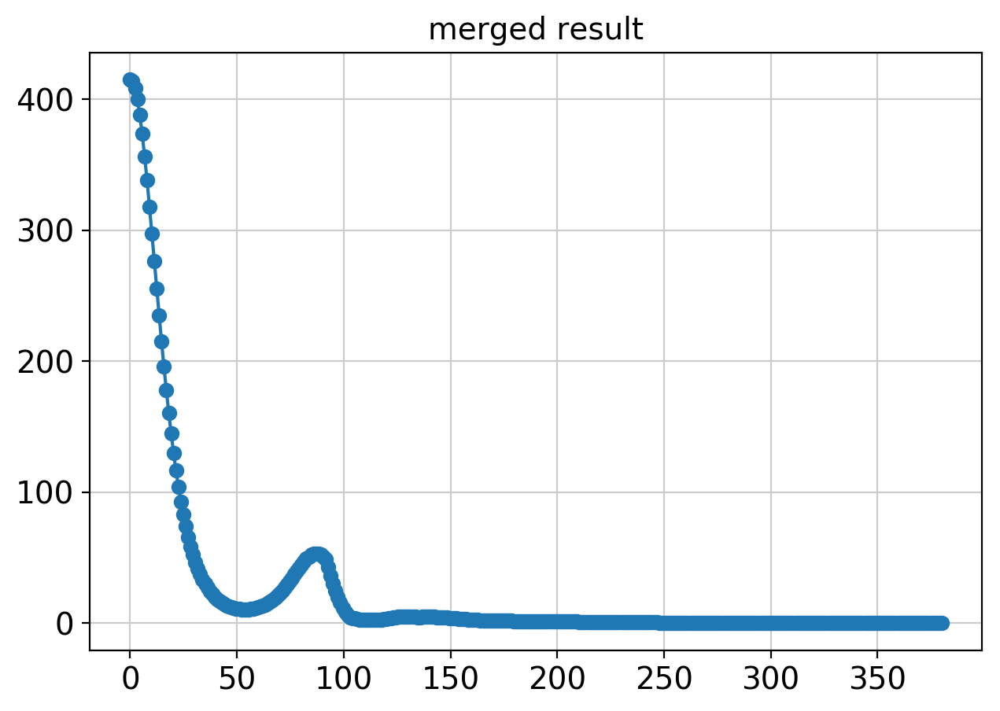

### debug: dd result after merging ### end ###

--- ccdf ---
>0.05: 35.58%
>0.1: 21.28%
>0.15: 18.43%
>0.2: 14.32%
>0.25: 4.679%
>0.3: 3.258%
>0.35: 2.471%
>0.4: 1.556%


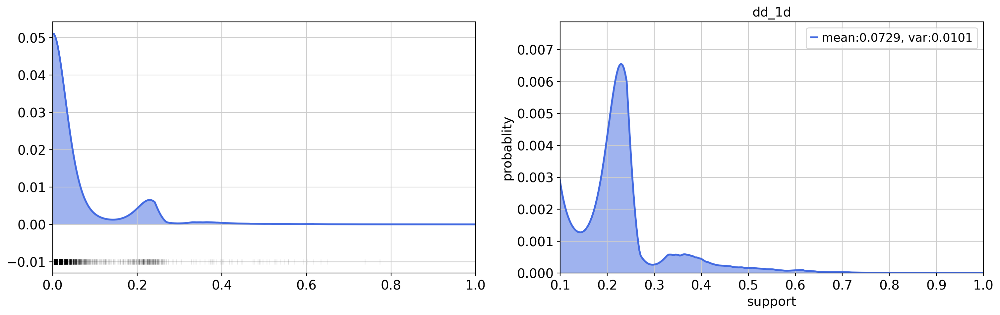

estimated gamma: 380.0


In [8]:
gene='FTL'
Y=np.array(adata[:,gene].X,dtype=int)
print(gene)
print("Average counts per cell =",np.sum(Y)/len(Y))
plt.figure(figsize=[8,5])
sns.distplot(Y)
plt.show()
plt.figure(figsize=[8,5])
p_hat_ml,ml_info=ml_1d(Y)
plt.plot(ml_info['x'],p_hat_ml)
plt.title('ML')
plt.show()

p_hat,dd_info=dd_1d(Y,noise='poi',verbose=1,n_degree=5,gamma=None,debug_mode=True)
print("estimated gamma:",dd_info['gamma'])

# plt.figure(figsize=[8,5])
# X=np.random.choice(dd_info['x'], 2000, p=p_hat)
# plt.plot(dd_info['x'],p_hat,marker='.',lw=2,markersize=0,color="royalblue")
# # plt.fill_between(x, p, facecolor='royalblue', alpha=0.5)
# # plt.xlim([0,1])
# # plt.ylim([0,1.05*np.max(p)])
# plt.plot(X, [-0.01]*len(X), '|', color='k',alpha=0.05)
# plt.show()

### N_r=137, mean_cts=9, N_c=10000


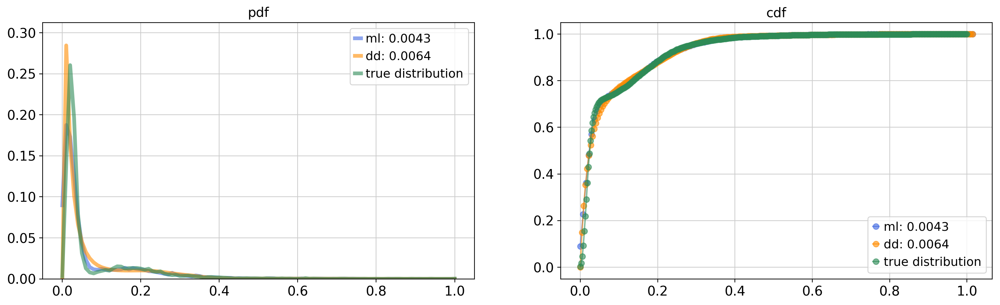



### N_r=1376, mean_cts=99, N_c=1000


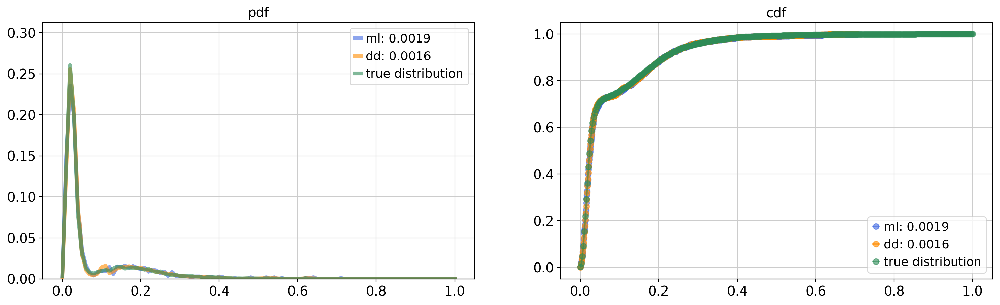

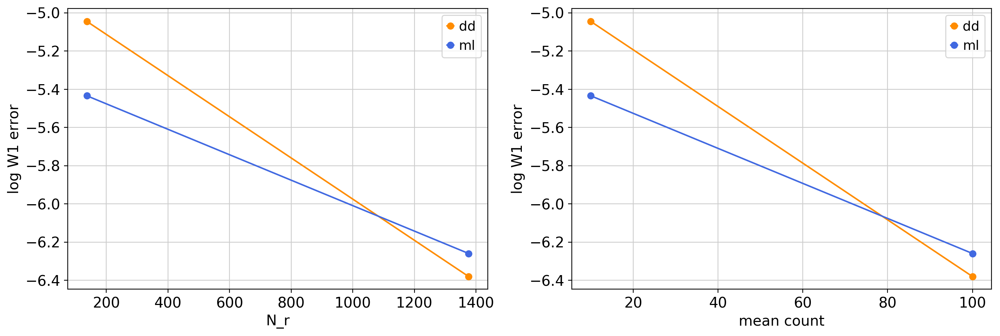

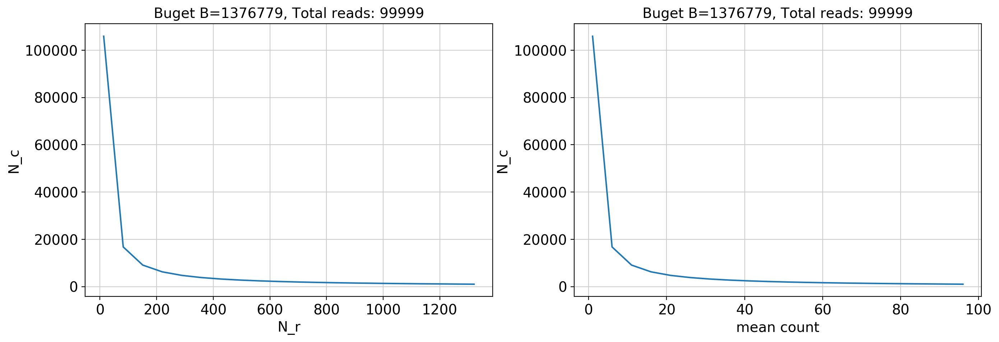

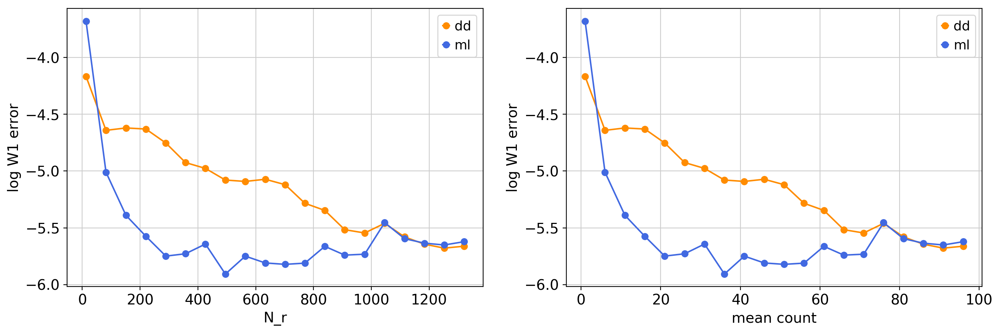

In [9]:
p_gene,x_gene = counts2pdf_1d(Y)
x_gene = x_gene/x_gene.max()
comparison_1d(p_gene,x_gene,1e5,mean_cts=[10,100],zero_inflate=True)
tradeoff_1d(p_gene,x_gene,1e5)

In [ ]:
genes=["S100A9","S100A8","S100A4","LGALS2","FCN1","CD14","GZMB","IGFBP7","CD79A","CD3E","LYZ","MS4A1",
       "GNLY","FGFBP2","FCER1G","LDHB","IL7R","LST1","PF4","NKG7","CST3","CCR7"]

S100A9
Average counts per cell = 16.659587161436583


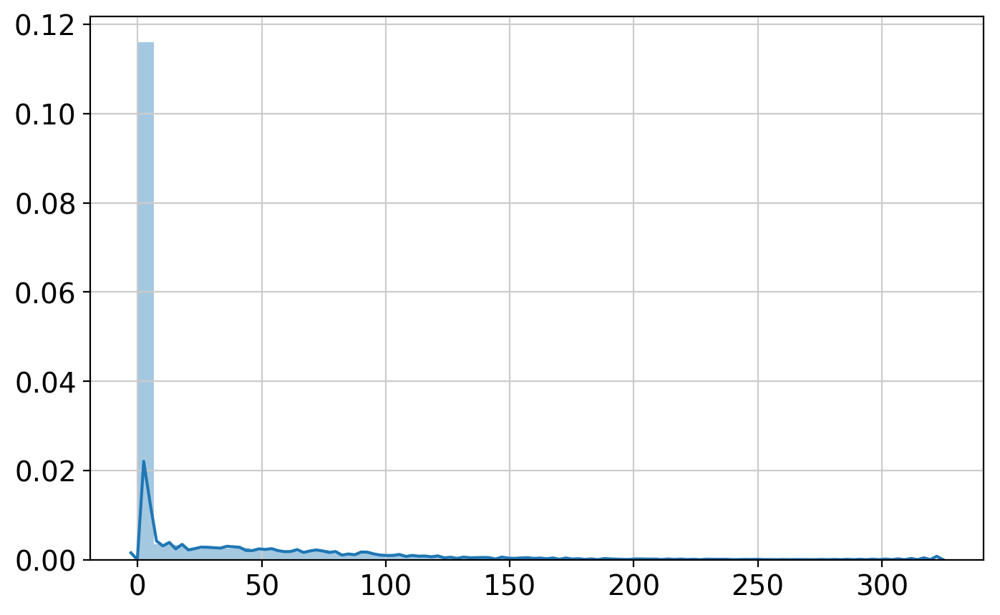

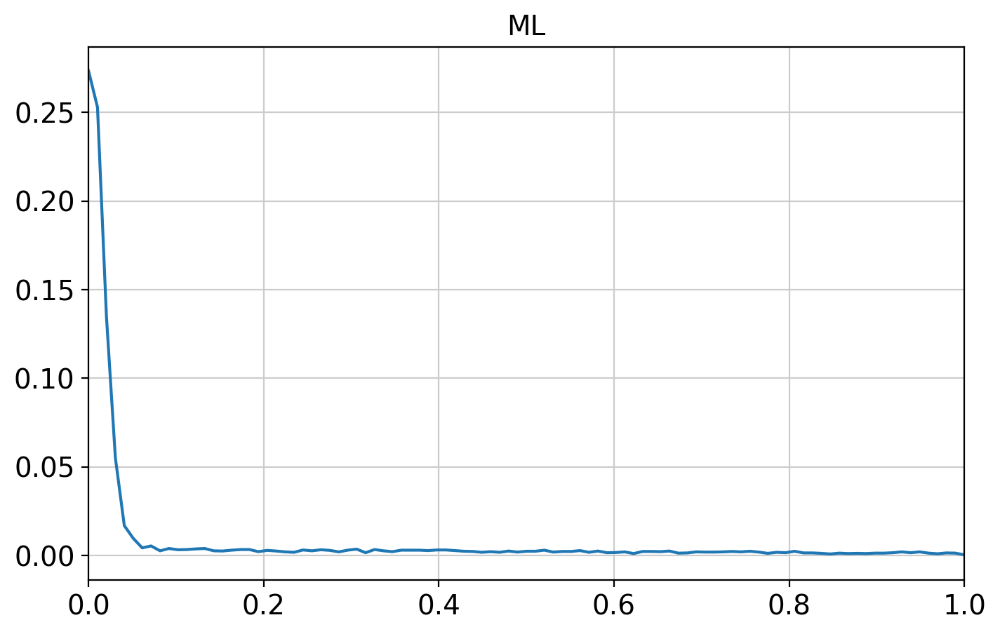

n_degree: 5, c_res: 2, c_reg: 1e-05, gamma: 98

### debug: proportion separation ### start ###


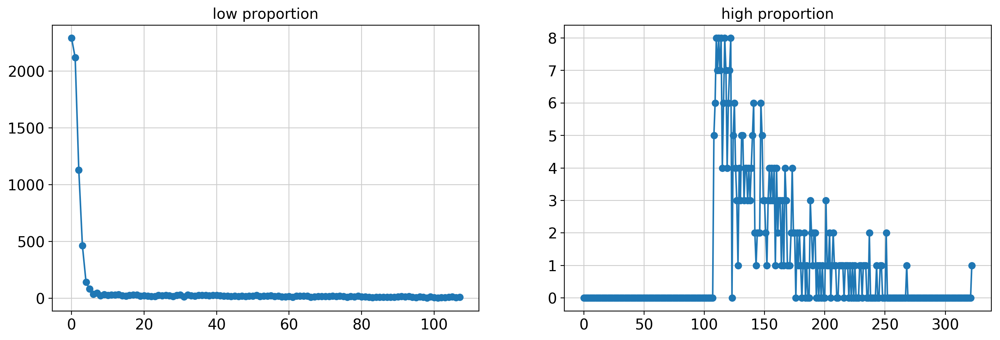

### debug: proportion separation ### end ###

### debug: proportion separation ### start ###
Numerical gradients
0.5822480595440993
-0.09745316464915277
-0.18522767319950617
-0.1965729721220555
-0.10309435971578296
Close-form gradients
[ 0.58224808 -0.09745315 -0.18522766 -0.19657295 -0.10309433]
### debug: proportion separation ### end ###

### debug: optimization ### start ###
c_reg 1e-05
-l:2.800342202328694, reg:0.0006779681769339067
### debug: optimization ### end ###

### debug: dd result before merging ### start ###
alpha_hat:  [ 4.21217762 -4.53083178  3.84847006 -3.82469279  0.29486271]
gamma:98


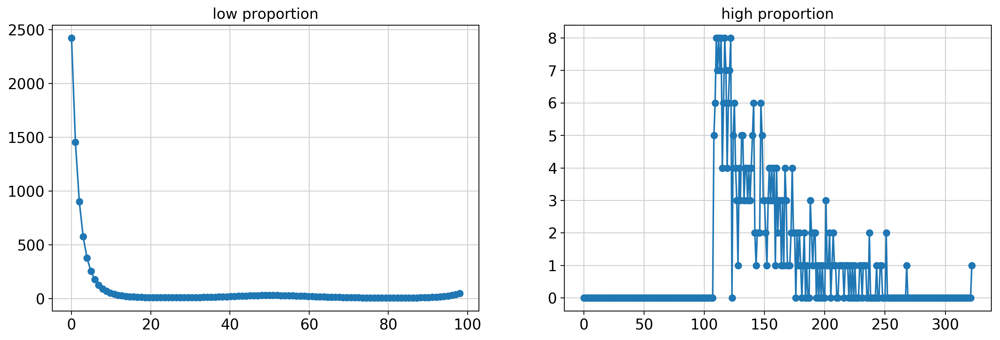

### debug: dd result before merging ### end ###

### debug: dd result after merging ### start ###
gamma:322.0


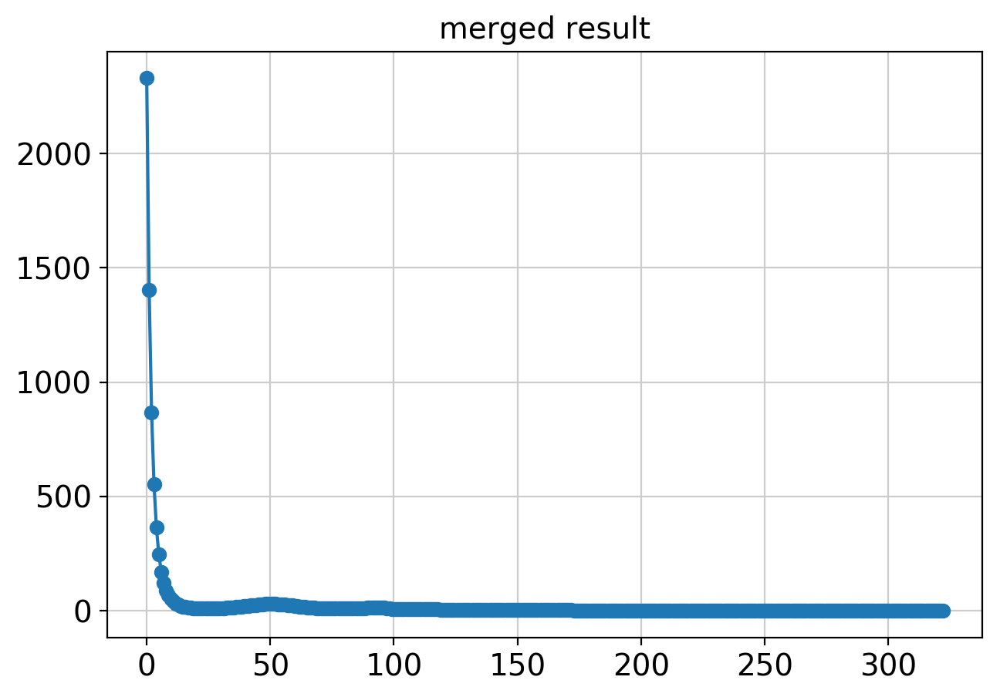

### debug: dd result after merging ### end ###

--- ccdf ---
>0.05: 20.47%
>0.1: 18.39%
>0.15: 14.11%
>0.2: 9.316%
>0.25: 7.098%
>0.3: 4.691%
>0.35: 3.388%
>0.4: 2.380%


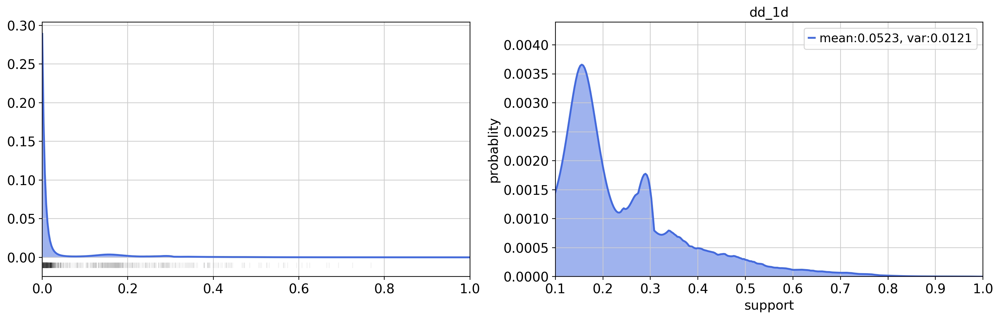

gamma: 322.0
### N_r=193, mean_cts=9, N_c=10000


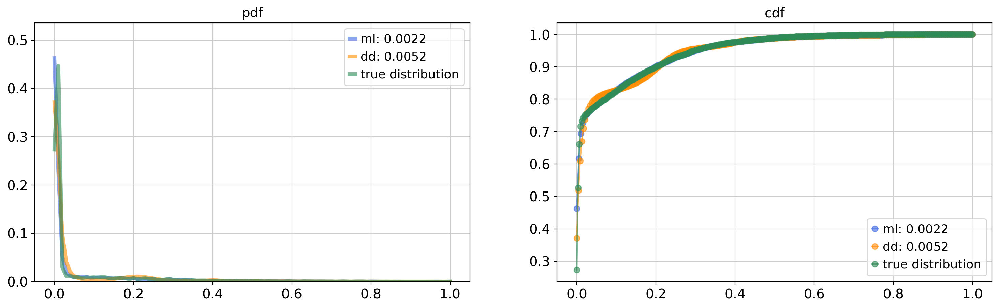



### N_r=1932, mean_cts=99, N_c=1000


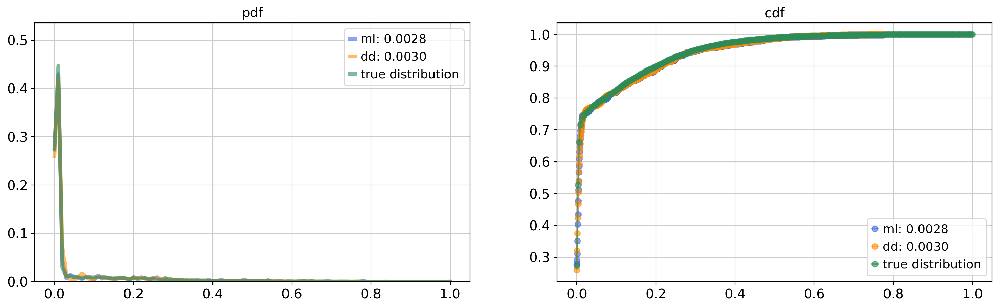

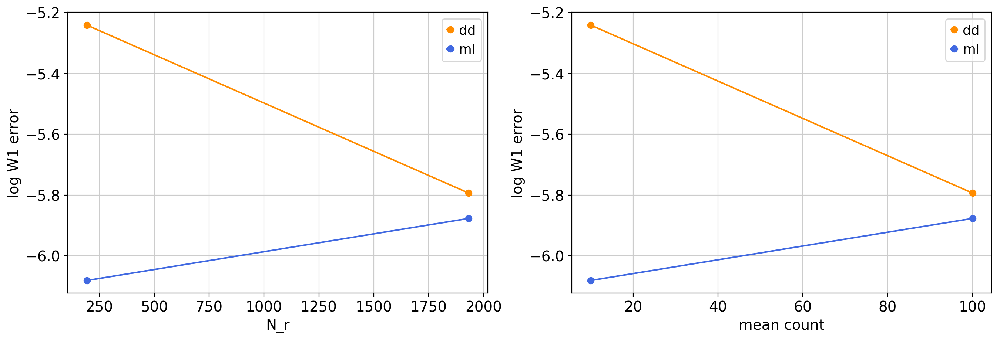

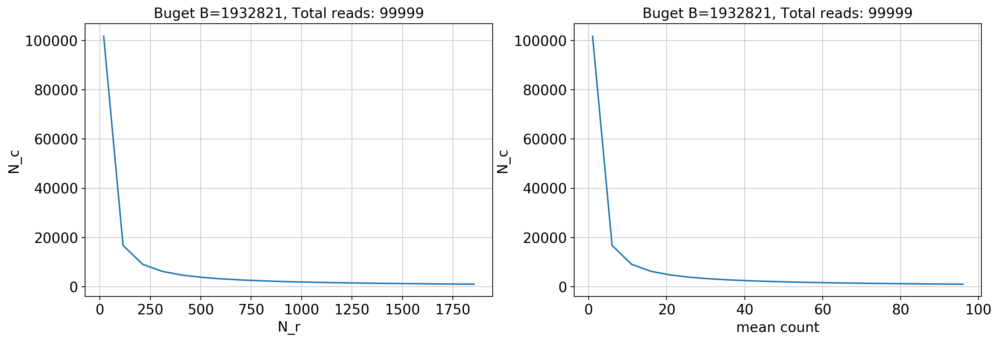

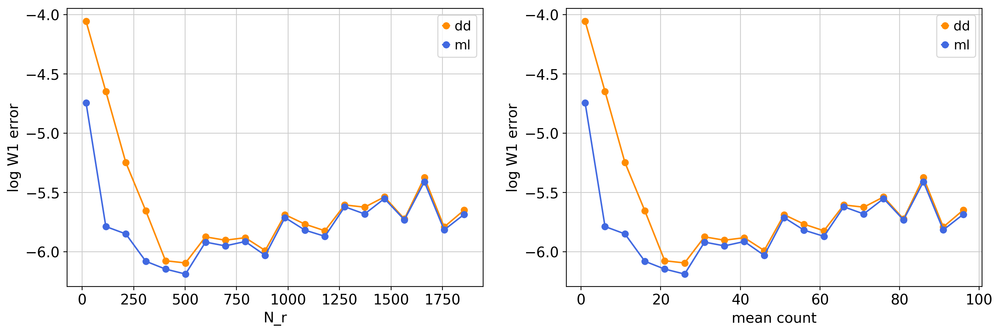

-------------------------------------------------------------------------
S100A8
Average counts per cell = 13.68273475718888


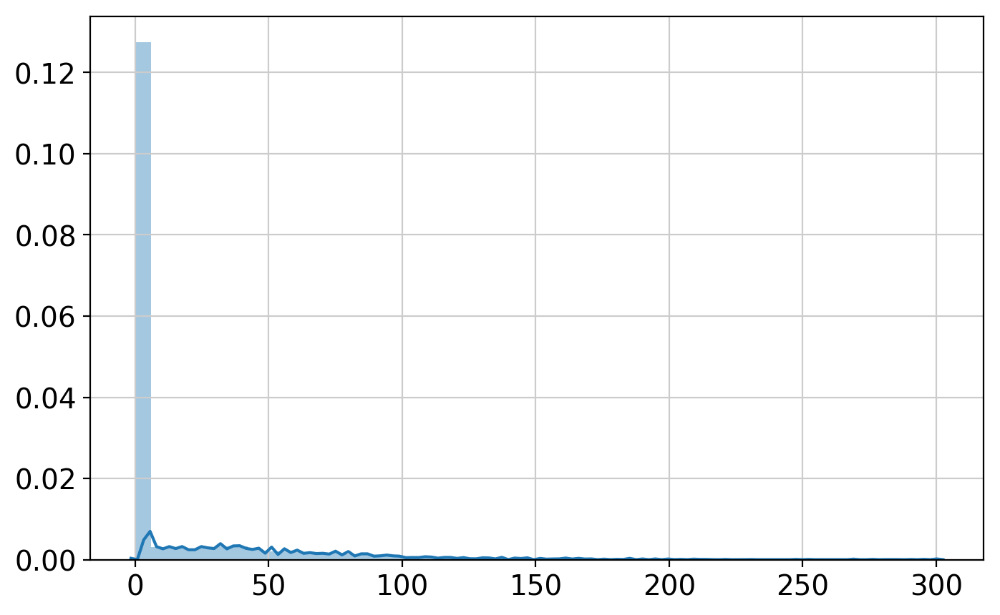

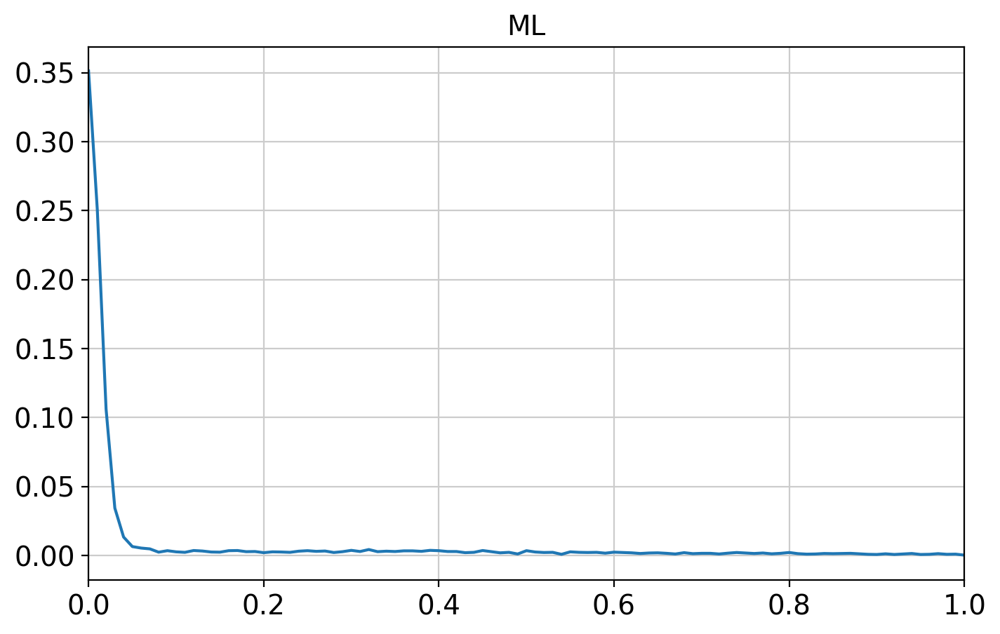

n_degree: 5, c_res: 2, c_reg: 1e-05, gamma: 100

### debug: proportion separation ### start ###


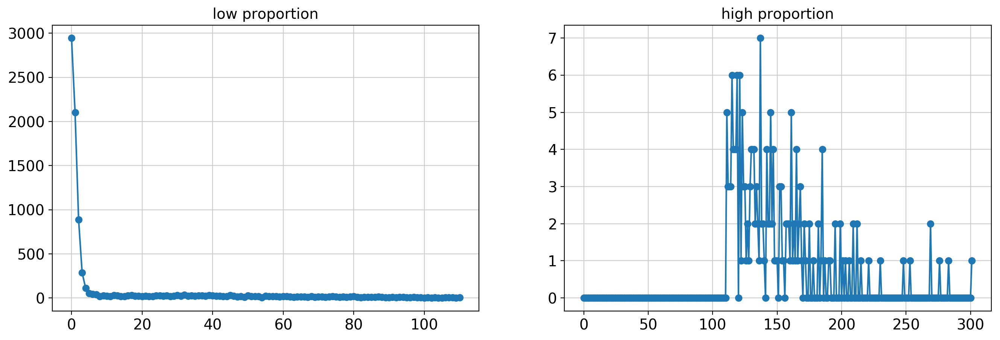

### debug: proportion separation ### end ###

### debug: proportion separation ### start ###
Numerical gradients
0.6015486313515339
-0.10617794199418995
-0.18487792452503982
-0.20139154610632204
-0.10920133775016438
Close-form gradients
[ 0.60154866 -0.10617792 -0.18487791 -0.20139153 -0.10920131]
### debug: proportion separation ### end ###

### debug: optimization ### start ###
c_reg 1e-05
-l:2.648020992221173, reg:0.0010578652384299189
### debug: optimization ### end ###

### debug: dd result before merging ### start ###
alpha_hat:  [ 4.4486095  -5.28870237  5.58432635 -5.16384253  0.419588  ]
gamma:100


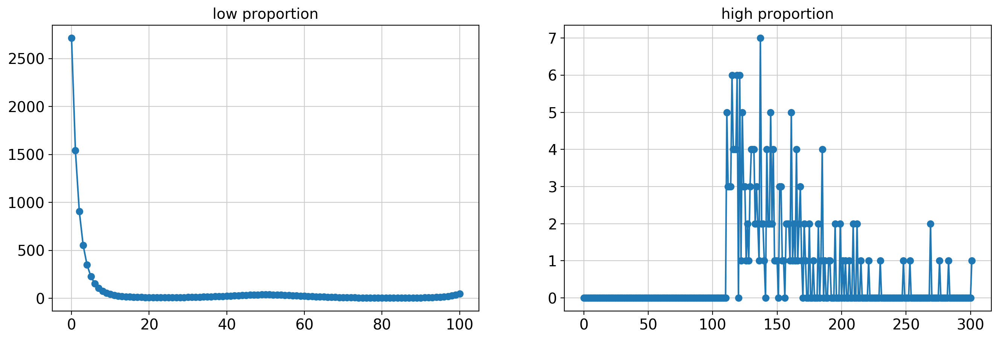

### debug: dd result before merging ### end ###

### debug: dd result after merging ### start ###
gamma:301.0


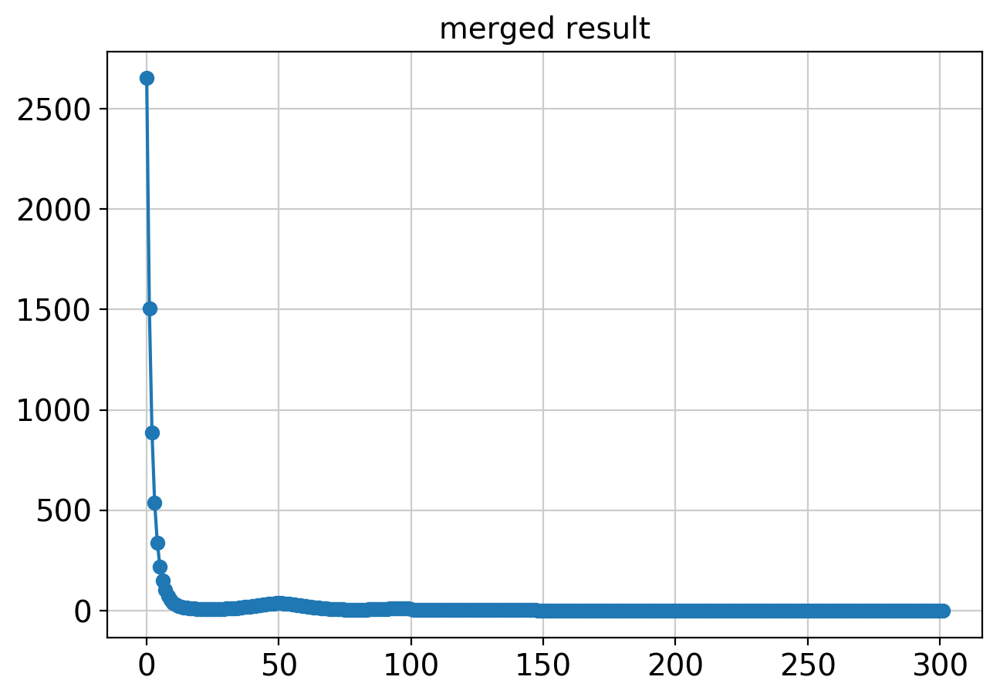

### debug: dd result after merging ### end ###

--- ccdf ---
>0.05: 18.58%
>0.1: 16.91%
>0.15: 13.26%
>0.2: 7.329%
>0.25: 5.271%
>0.3: 4.129%
>0.35: 2.527%
>0.4: 1.818%


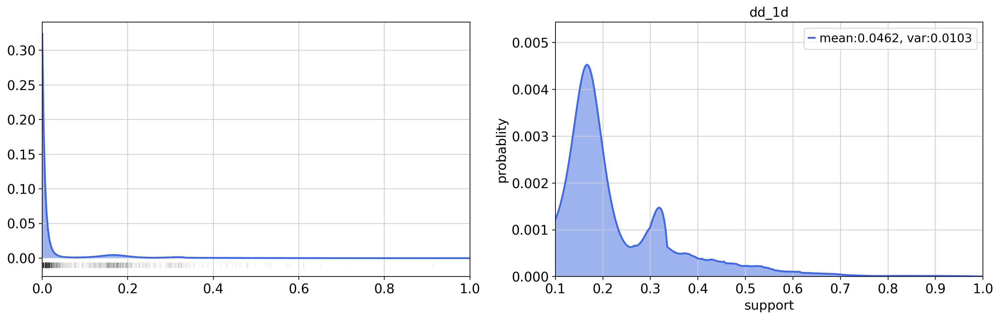

gamma: 301.0
### N_r=219, mean_cts=9, N_c=10000


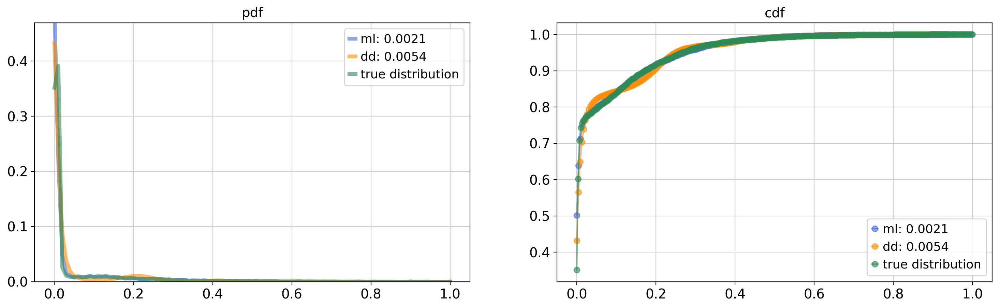



### N_r=2199, mean_cts=99, N_c=1000


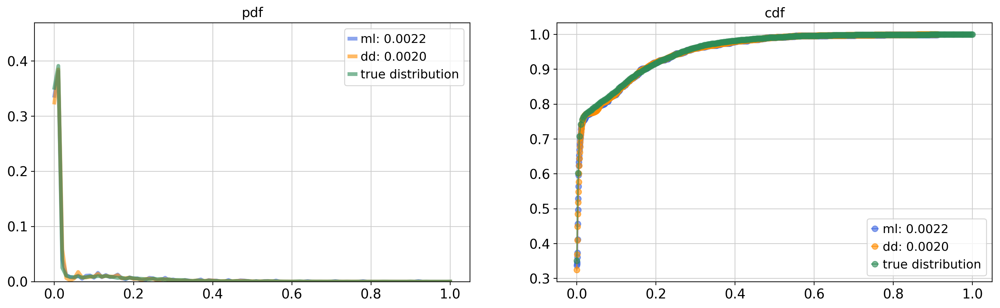

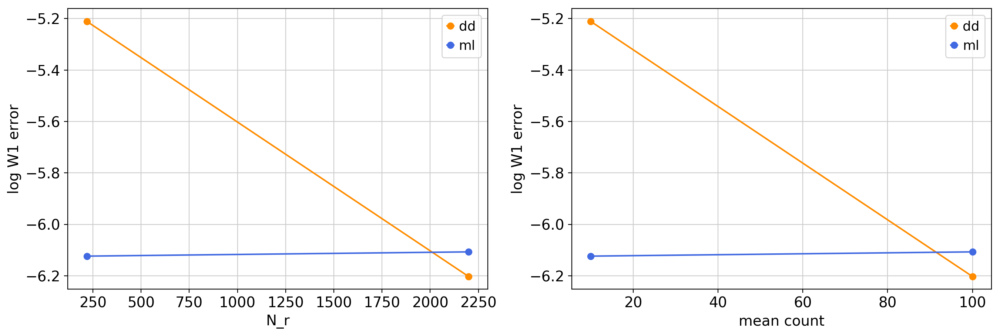

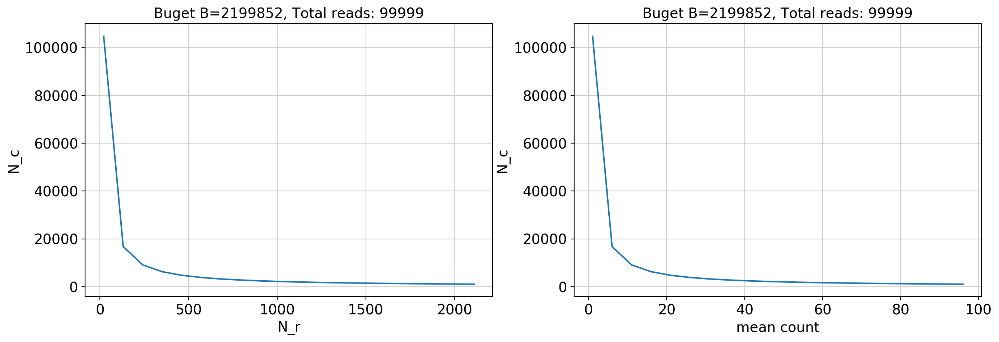

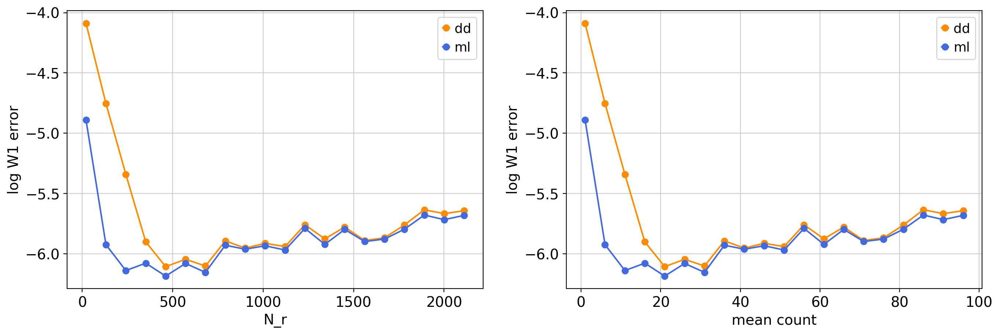

-------------------------------------------------------------------------
S100A4
Average counts per cell = 10.855745137811716


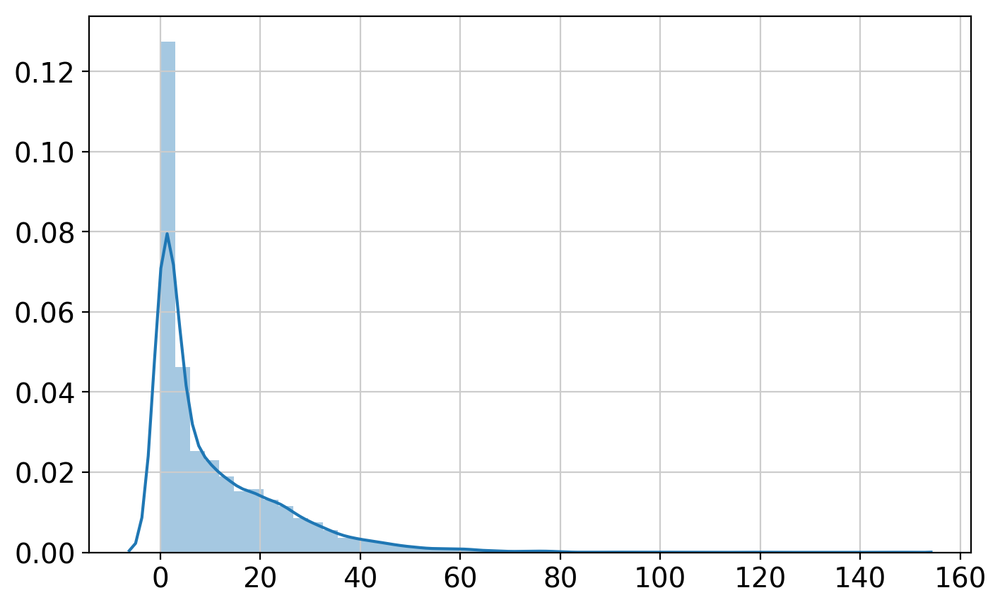

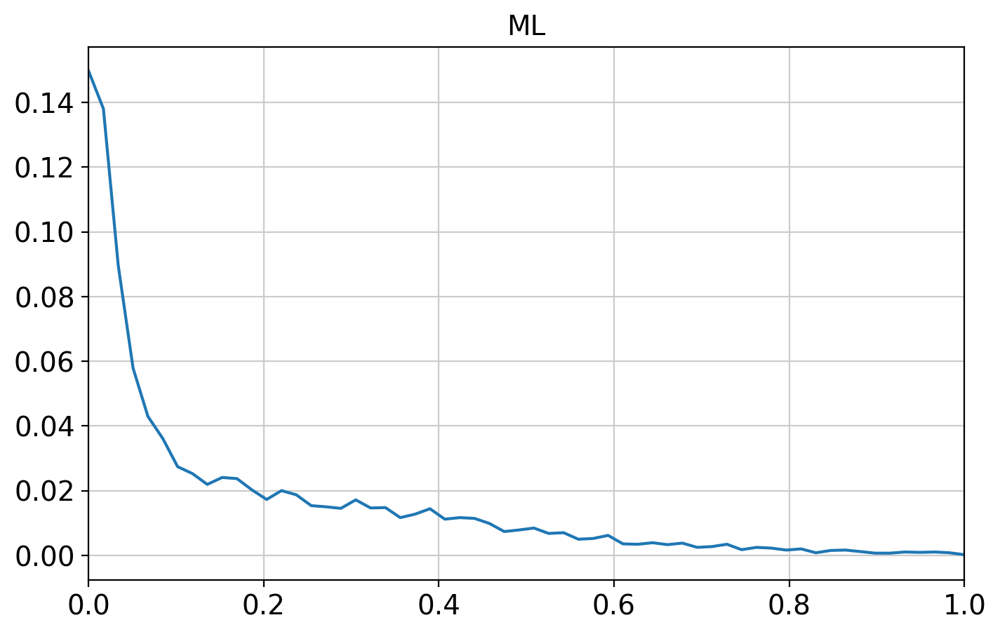

n_degree: 5, c_res: 2, c_reg: 1e-05, gamma: 59

### debug: proportion separation ### start ###


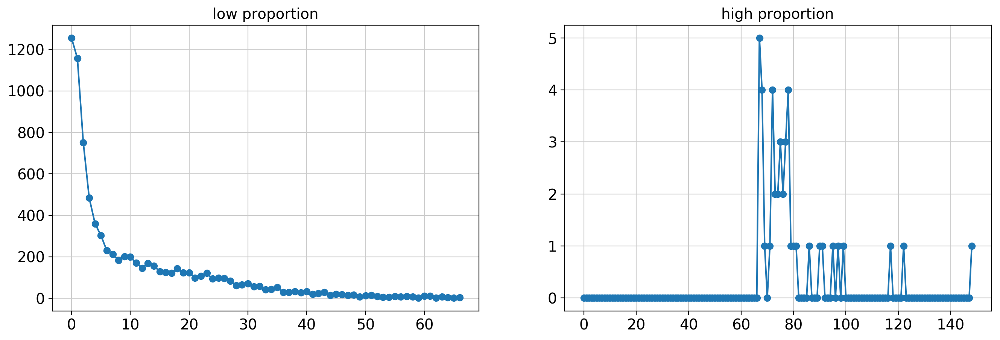

### debug: proportion separation ### end ###

### debug: proportion separation ### start ###
Numerical gradients
0.3404246440297243
0.058499646016230145
-0.10392511384793579
-0.18089728559544938
-0.11420200074496734
Close-form gradients
[ 0.34042467  0.05849966 -0.1039251  -0.18089726 -0.11420197]
### debug: proportion separation ### end ###

### debug: optimization ### start ###
c_reg 1e-05
-l:3.328910432049171, reg:0.000286267713112087
### debug: optimization ### end ###

### debug: dd result before merging ### start ###
alpha_hat:  [ 2.95768335 -0.41427148  2.25069818 -3.65201474 -1.14210582]
gamma:59


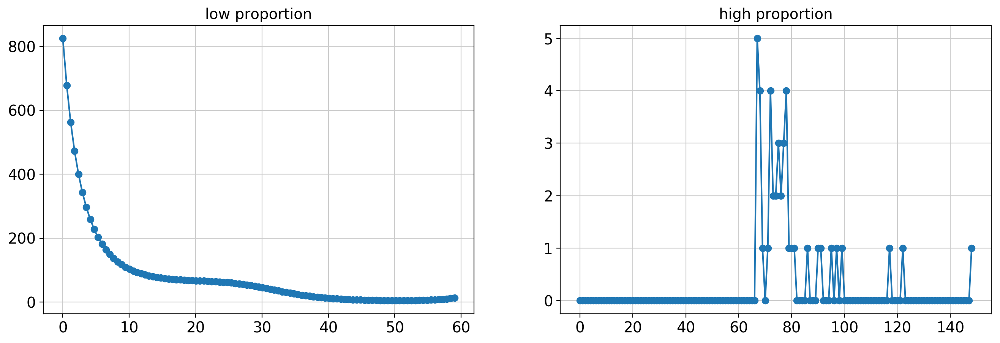

### debug: dd result before merging ### end ###

### debug: dd result after merging ### start ###
gamma:148.0


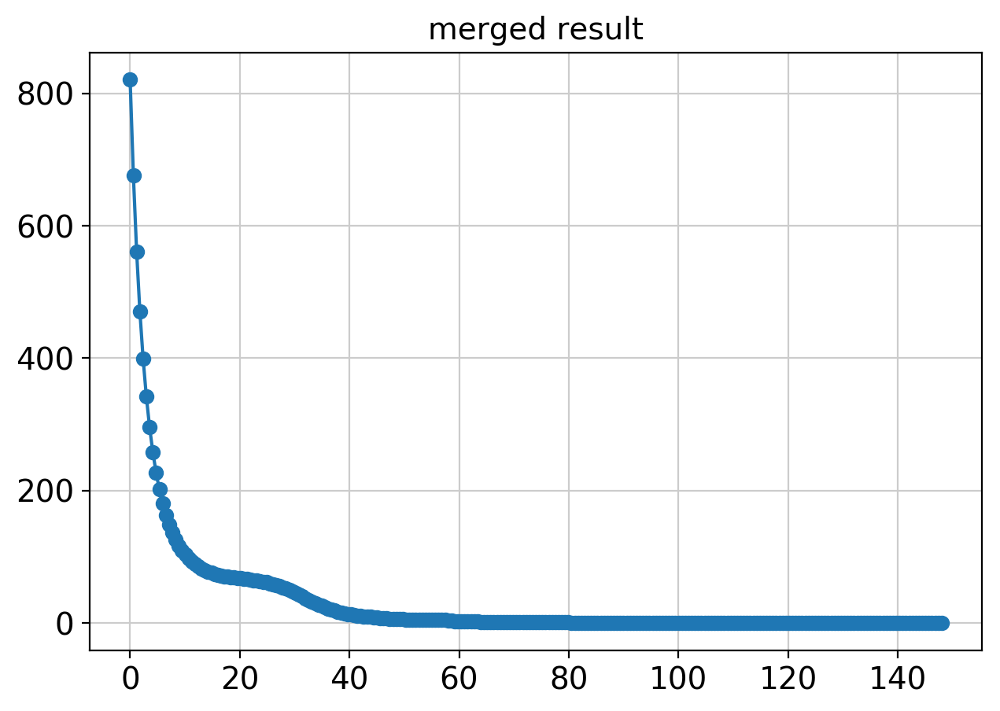

### debug: dd result after merging ### end ###

--- ccdf ---
>0.05: 43.09%
>0.1: 27.86%
>0.15: 17.91%
>0.2: 8.935%
>0.25: 4.357%
>0.3: 2.397%
>0.35: 1.508%
>0.4: 0.790%


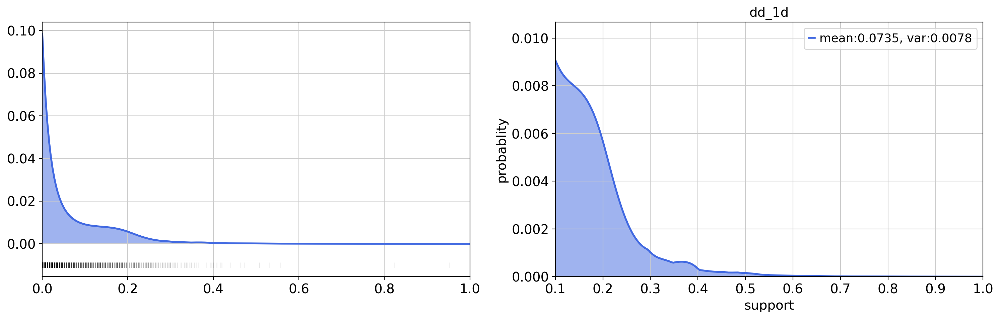

gamma: 148.0
### N_r=136, mean_cts=9, N_c=10000


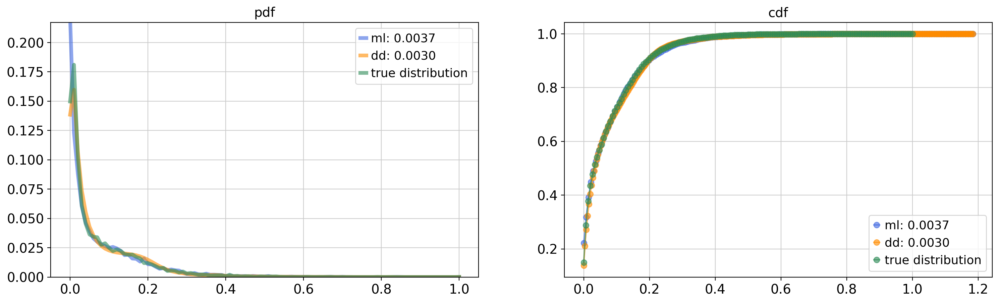



### N_r=1363, mean_cts=99, N_c=1000


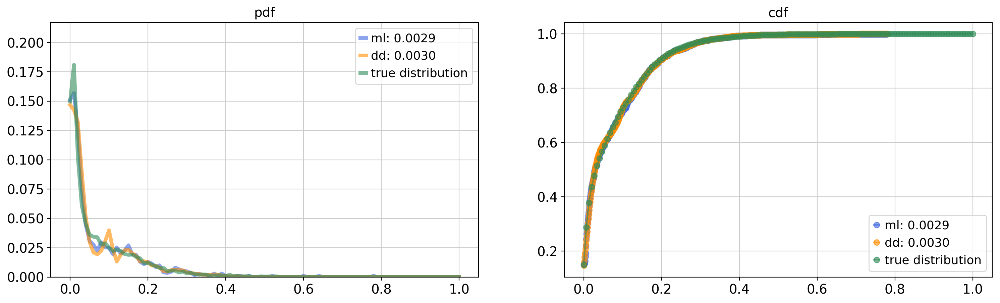

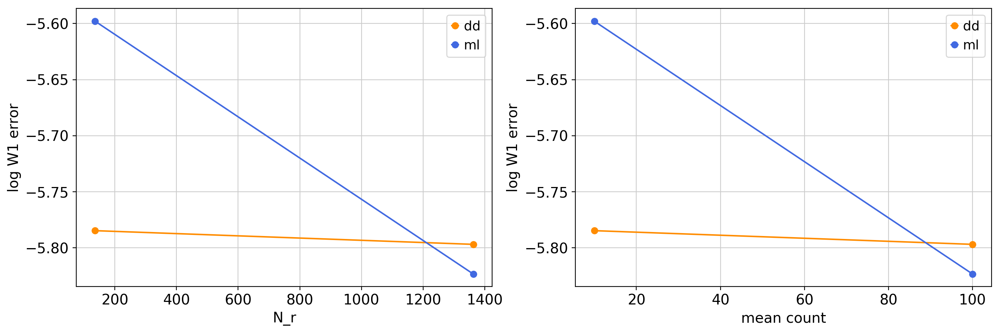

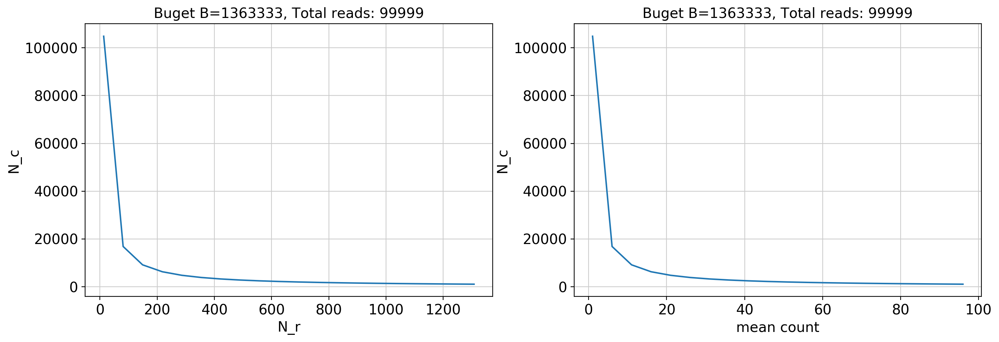

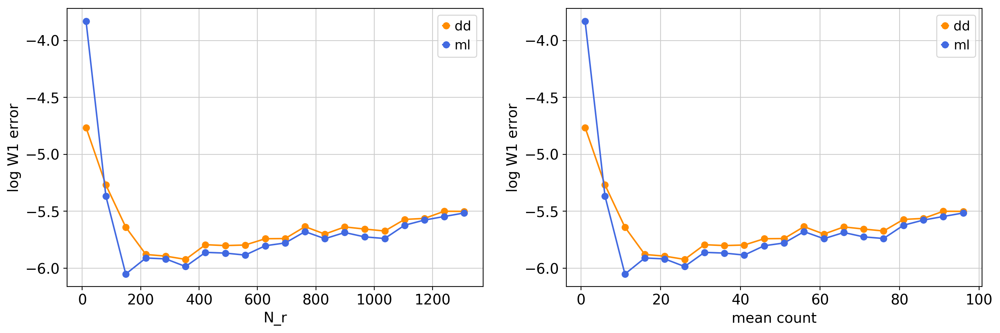

-------------------------------------------------------------------------
LGALS2
Average counts per cell = 1.2554587758024103


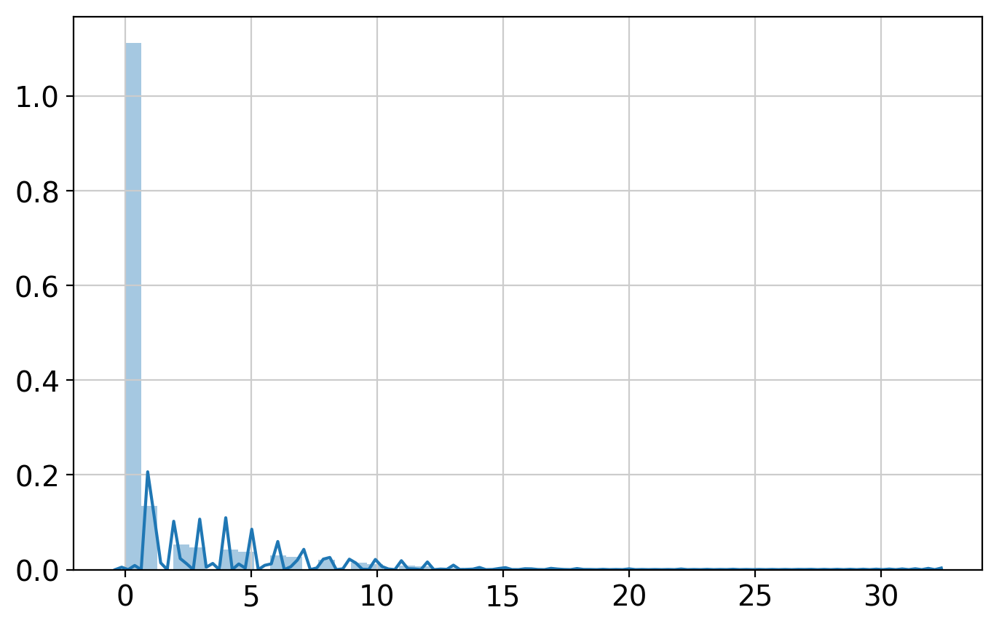

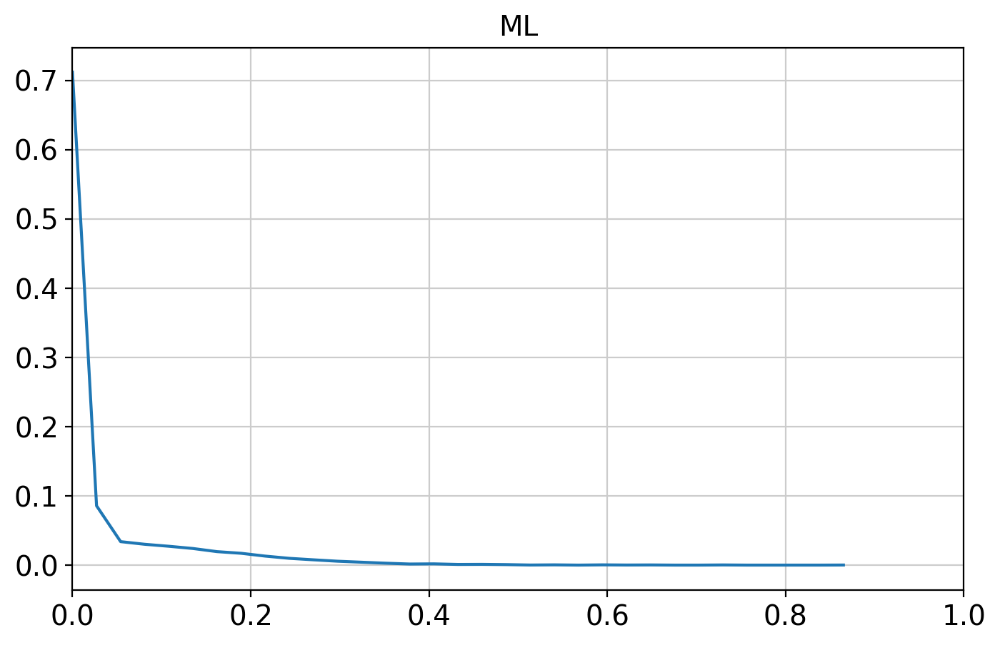

n_degree: 5, c_res: 2, c_reg: 1e-05, gamma: 37

### debug: proportion separation ### start ###


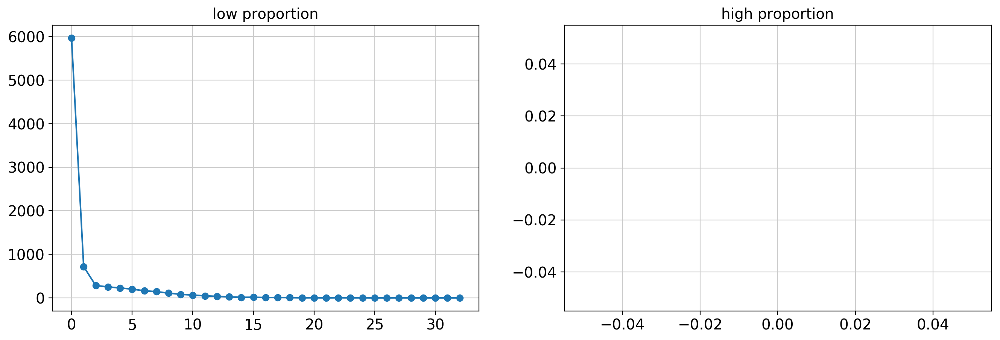

### debug: proportion separation ### end ###

### debug: proportion separation ### start ###
Numerical gradients
0.629420497944011
-0.05087990251340102
-0.20914113862957606
-0.2409305484007973
-0.1285690145458318
Close-form gradients
[ 0.62942052 -0.05087989 -0.20914112 -0.24093053 -0.12856899]
### debug: proportion separation ### end ###

### debug: optimization ### start ###
c_reg 1e-05
-l:1.330905492134471, reg:0.013085984320843657
### debug: optimization ### end ###

### debug: dd result before merging ### start ###
alpha_hat:  [  9.96375149  -0.45377887  18.92278878 -29.1635156    0.73047649]
gamma:37


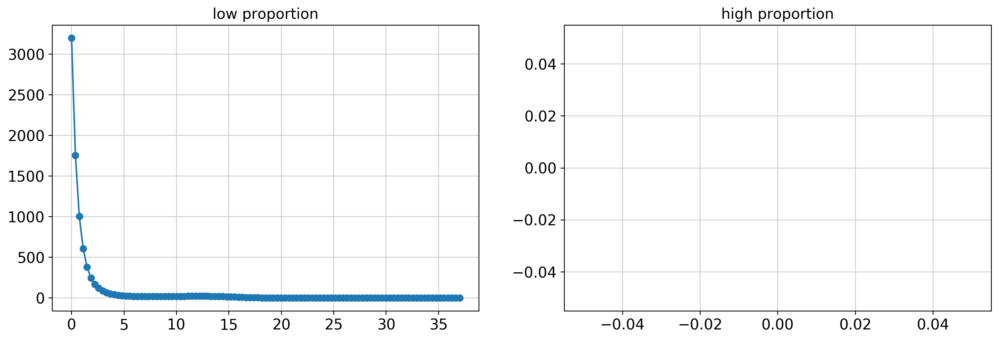

### debug: dd result before merging ### end ###

### debug: dd result after merging ### start ###
gamma:37.0


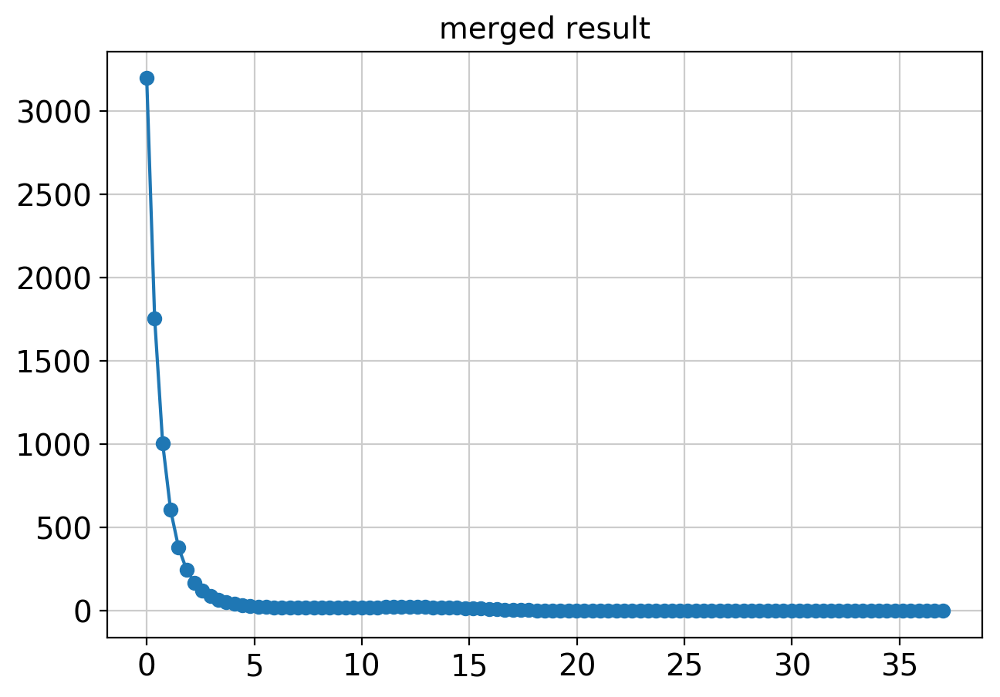

### debug: dd result after merging ### end ###

--- ccdf ---
>0.05: 14.21%
>0.1: 8.360%
>0.15: 6.536%
>0.2: 5.419%
>0.25: 4.370%
>0.3: 3.182%
>0.35: 1.886%
>0.4: 0.786%


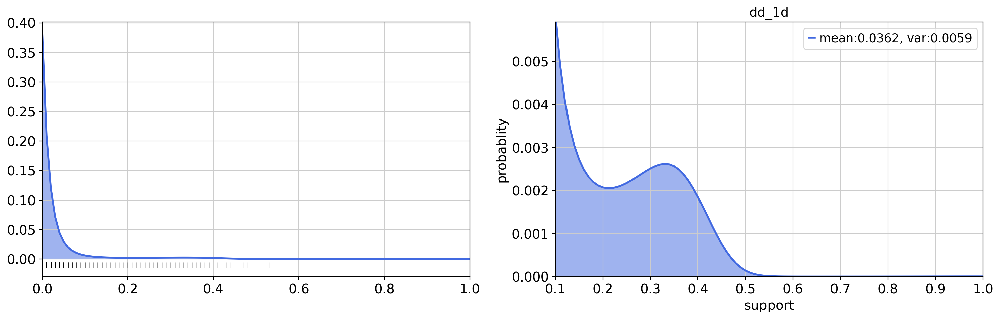

gamma: 37.0
### N_r=254, mean_cts=9, N_c=10000


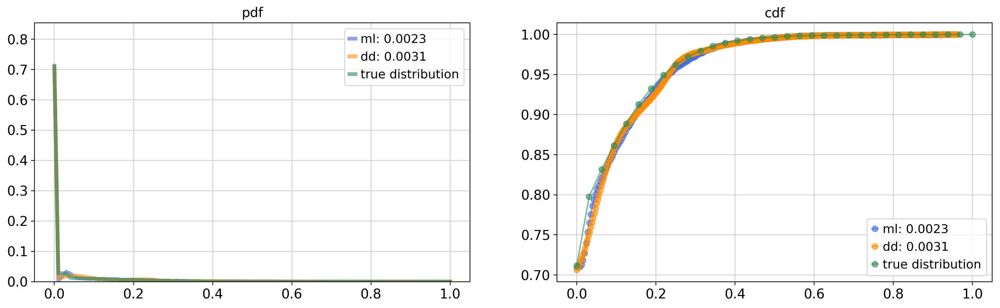



### N_r=2548, mean_cts=99, N_c=1000


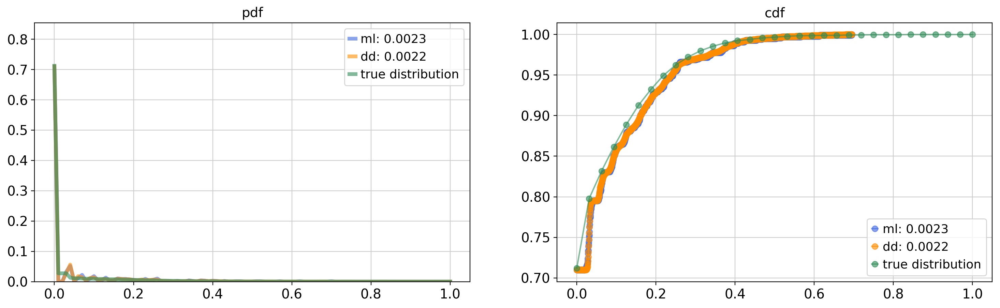

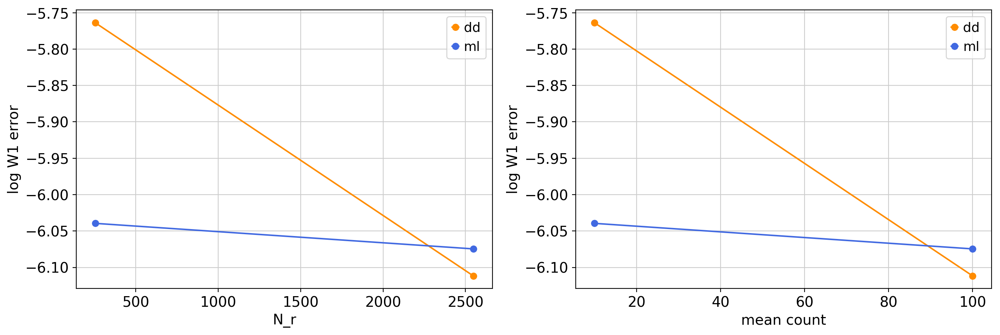

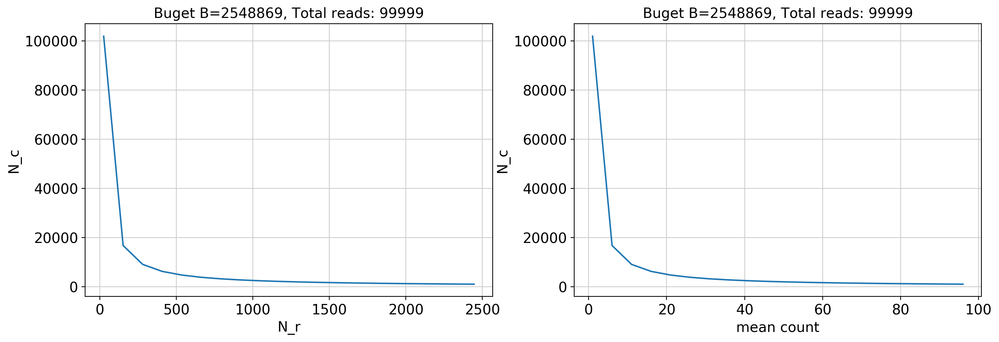

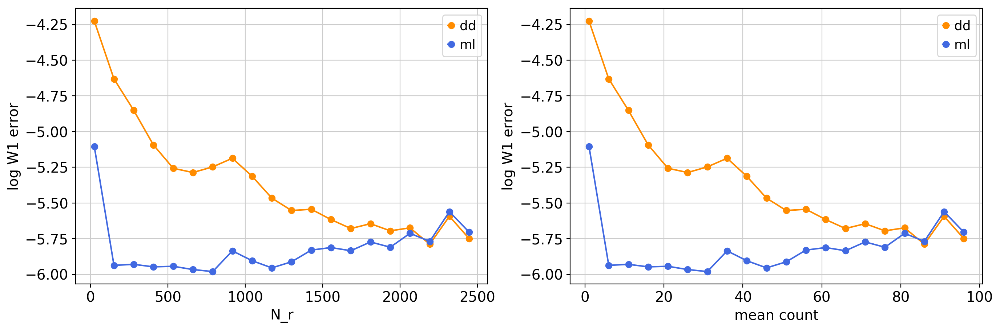

-------------------------------------------------------------------------
FCN1
Average counts per cell = 2.1746808256771266


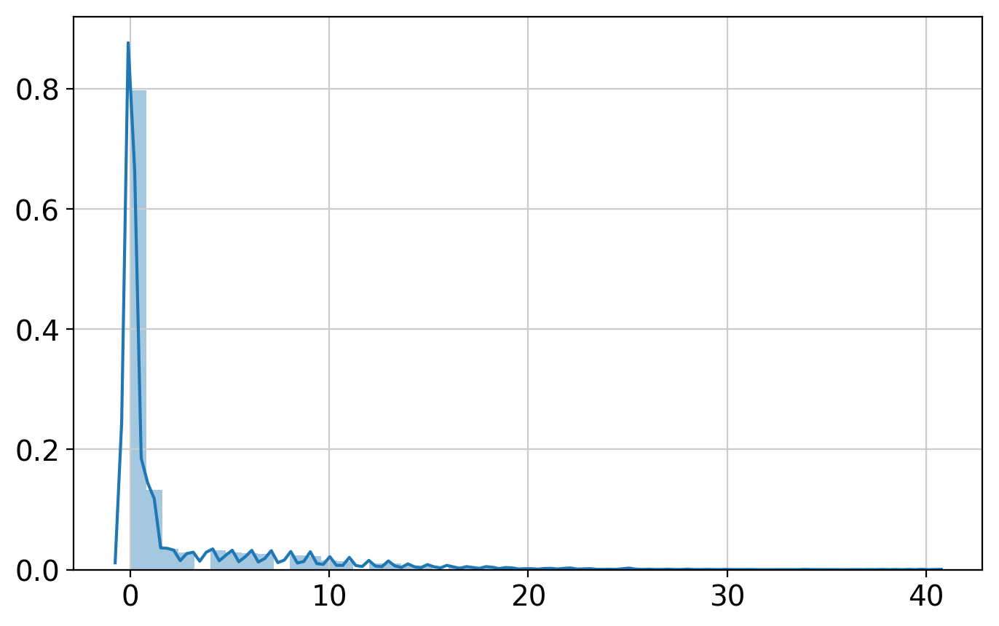

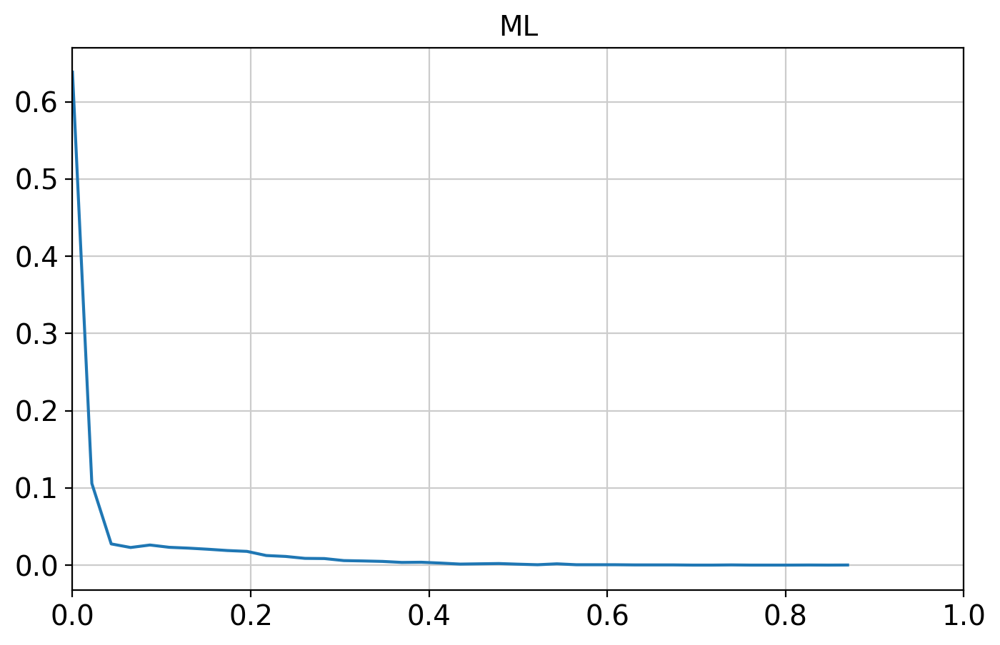

n_degree: 5, c_res: 2, c_reg: 1e-05, gamma: 46

### debug: proportion separation ### start ###


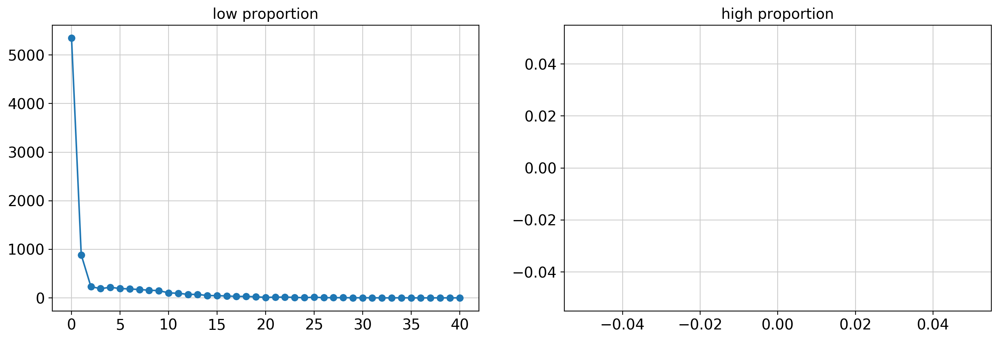

### debug: proportion separation ### end ###

### debug: proportion separation ### start ###
Numerical gradients
0.6146286635200227
-0.04993567070954441
-0.1993855049953197
-0.23702433171735038
-0.1283832684606523
Close-form gradients
[ 0.61462869 -0.04993565 -0.19938549 -0.23702431 -0.12838324]
### debug: proportion separation ### end ###

### debug: optimization ### start ###
c_reg 1e-05
-l:1.6733090470738372, reg:0.015399086393417883
### debug: optimization ### end ###

### debug: dd result before merging ### start ###
alpha_hat:  [  9.76926625  -0.30661659  20.50685764 -31.93707317   1.96677635]
gamma:46


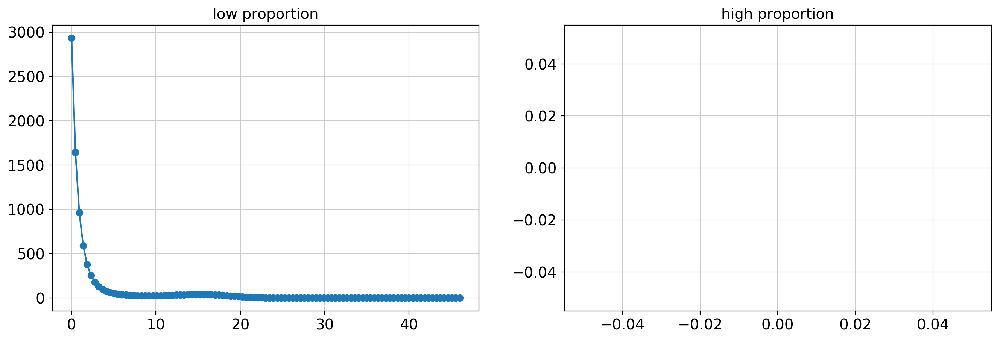

### debug: dd result before merging ### end ###

### debug: dd result after merging ### start ###
gamma:46.0


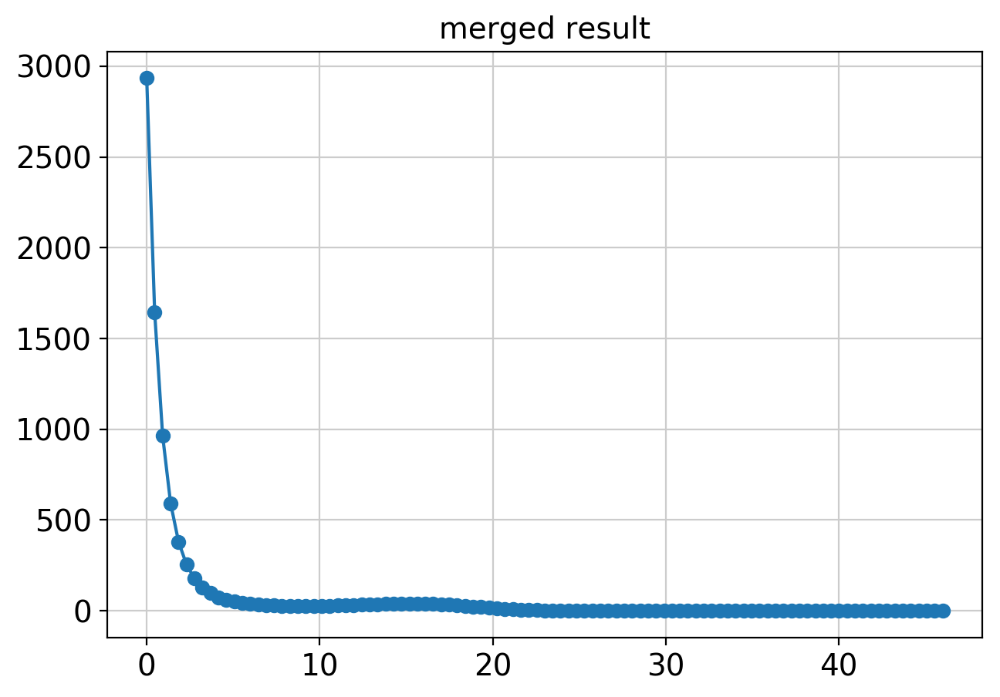

### debug: dd result after merging ### end ###

--- ccdf ---
>0.05: 19.24%
>0.1: 12.86%
>0.15: 10.59%
>0.2: 9.026%
>0.25: 7.387%
>0.3: 5.387%
>0.35: 3.575%
>0.4: 1.232%


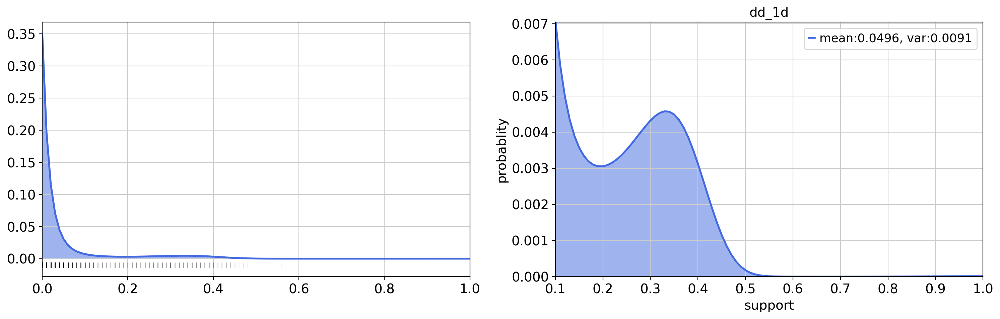

gamma: 46.0
### N_r=183, mean_cts=9, N_c=10000


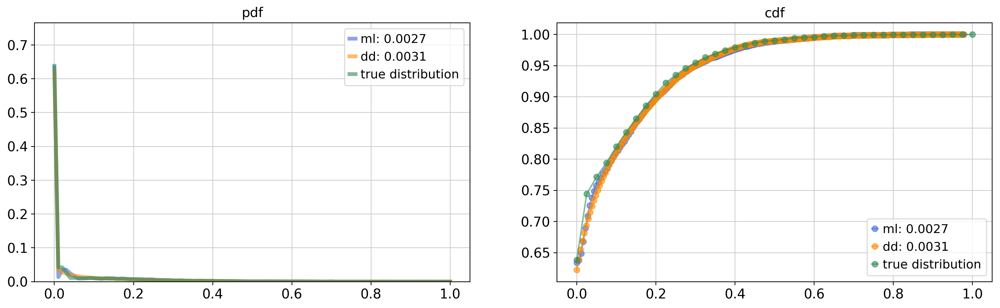



### N_r=1839, mean_cts=99, N_c=1000


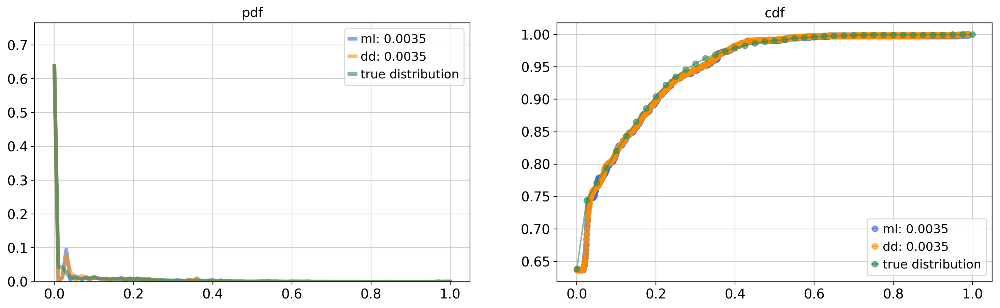

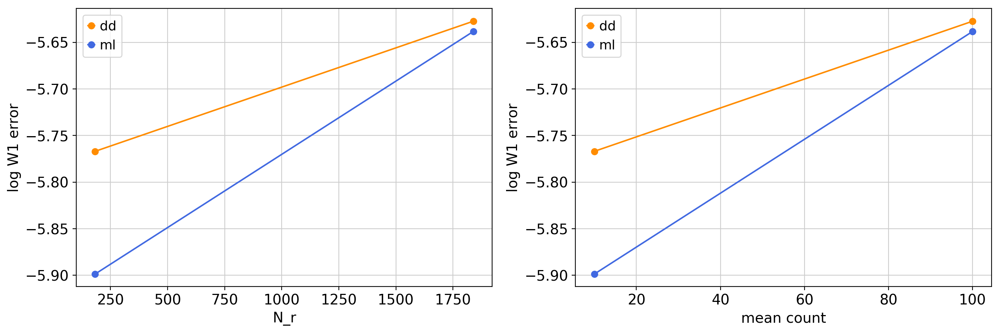

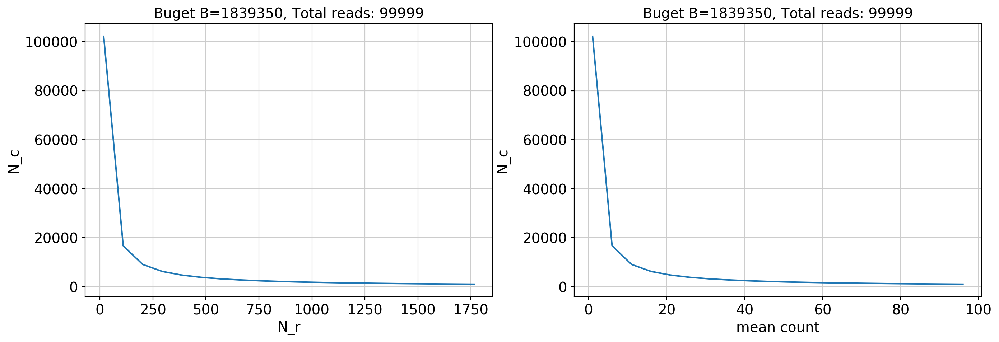

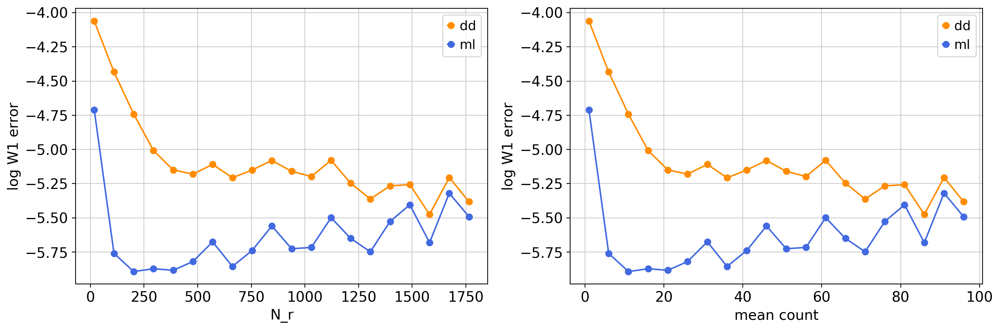

-------------------------------------------------------------------------
CD14
Average counts per cell = 0.6564849063357595


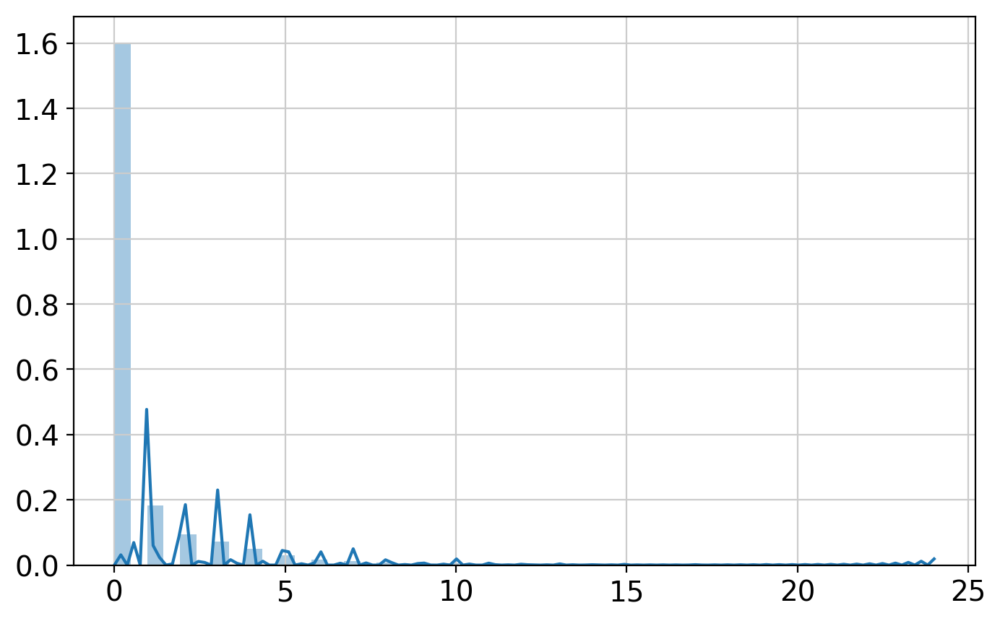

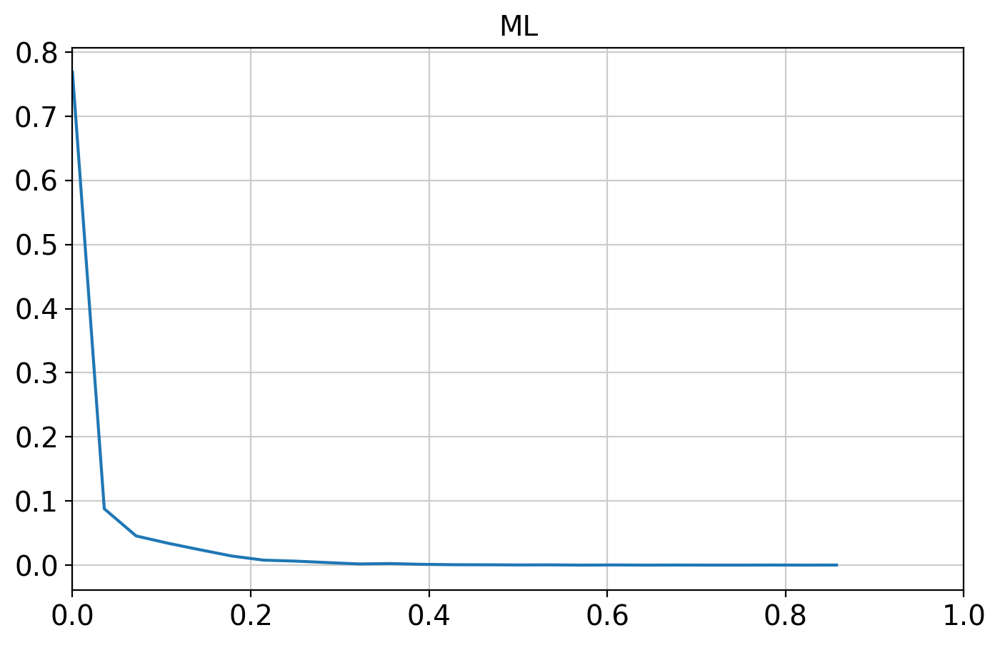

n_degree: 5, c_res: 2, c_reg: 1e-05, gamma: 28

### debug: proportion separation ### start ###


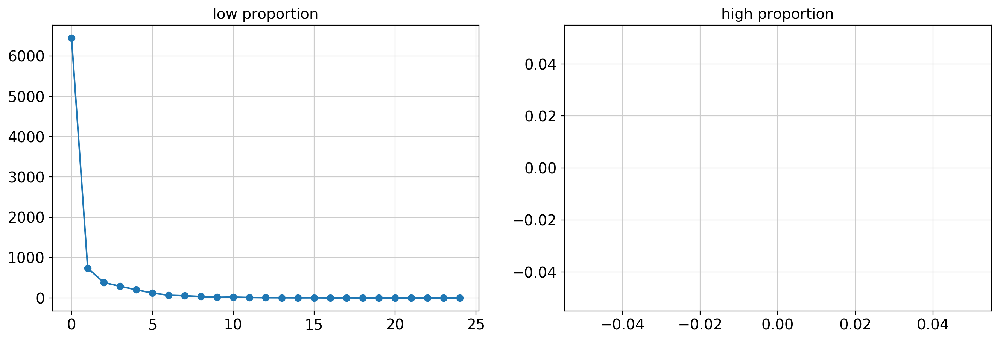

### debug: proportion separation ### end ###

### debug: proportion separation ### start ###
Numerical gradients
0.6246264008247238
-0.03920077862318294
-0.21411146455818653
-0.24280908661467038
-0.12860517006885175
Close-form gradients
[ 0.62462642 -0.03920076 -0.21411145 -0.24280906 -0.12860514]
### debug: proportion separation ### end ###

### debug: optimization ### start ###
c_reg 1e-05
-l:1.0002654757861635, reg:0.005210994935558406
### debug: optimization ### end ###

### debug: dd result before merging ### start ###
alpha_hat:  [  8.56935838  -1.93382834  11.79889044 -17.4268979   -1.00762703]
gamma:28


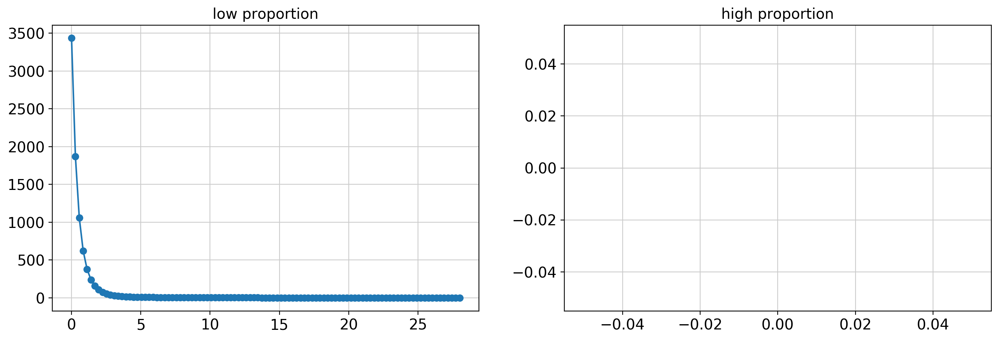

### debug: dd result before merging ### end ###

### debug: dd result after merging ### start ###
gamma:28.0


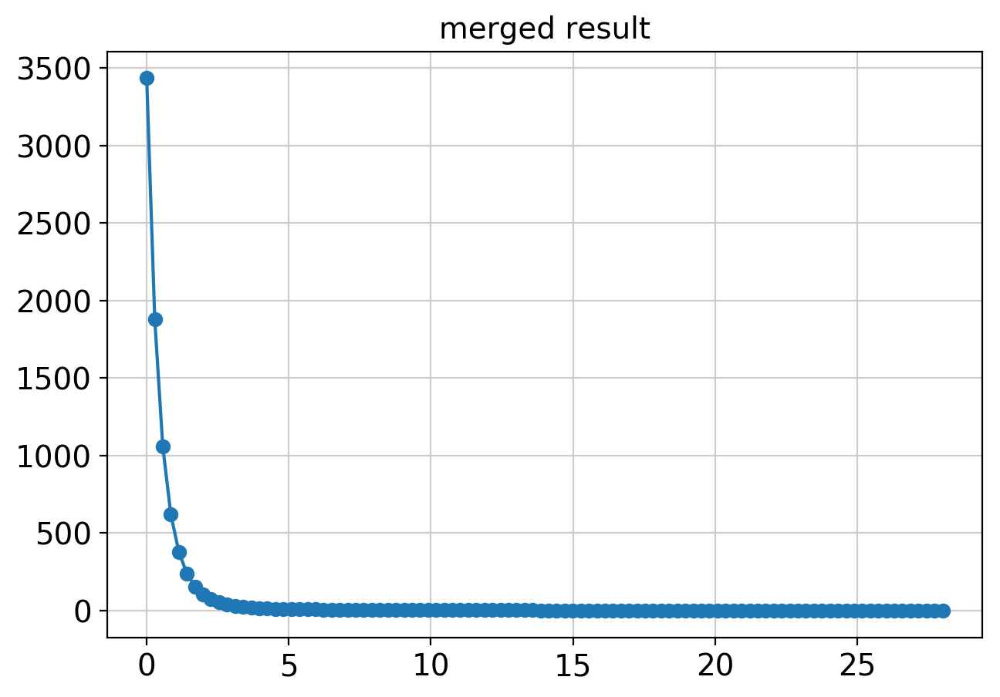

### debug: dd result after merging ### end ###

--- ccdf ---
>0.05: 12.00%
>0.1: 4.496%
>0.15: 2.945%
>0.2: 2.305%
>0.25: 1.870%
>0.3: 1.466%
>0.35: 1.041%
>0.4: 0.615%


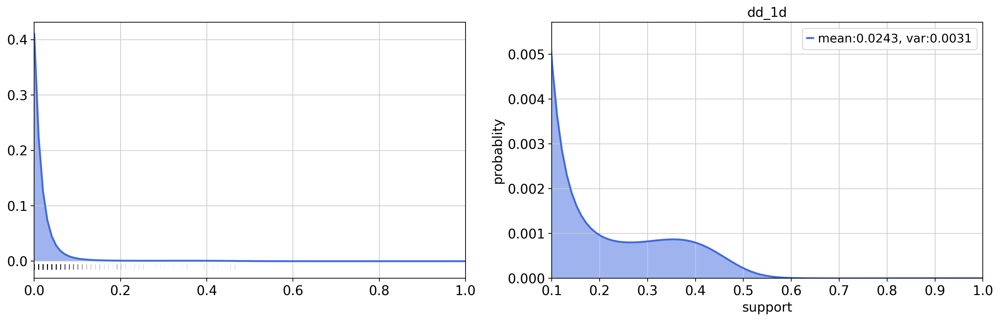

gamma: 28.0
### N_r=365, mean_cts=9, N_c=10000


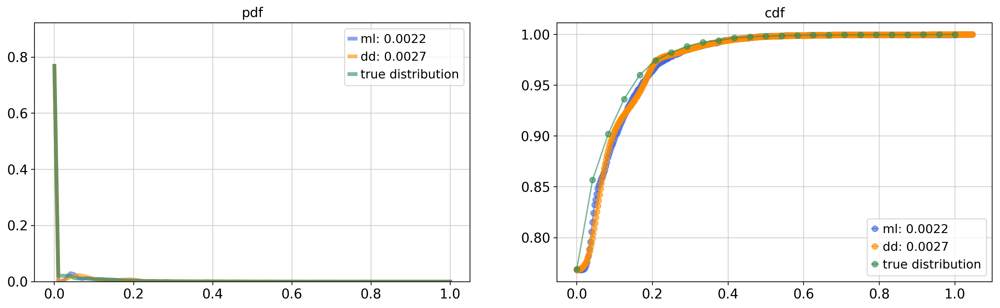



### N_r=3655, mean_cts=99, N_c=1000


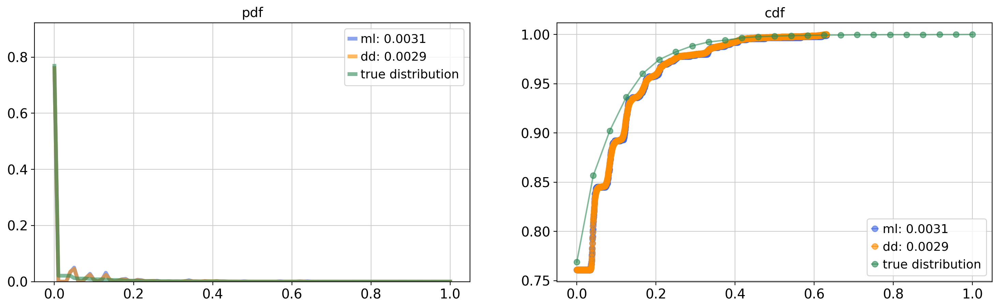

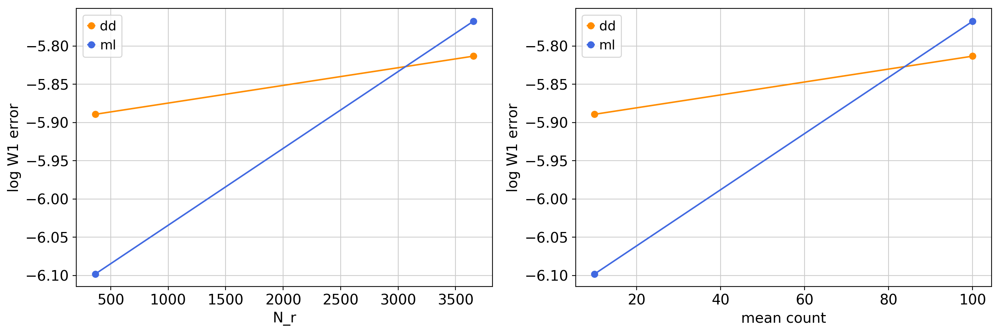

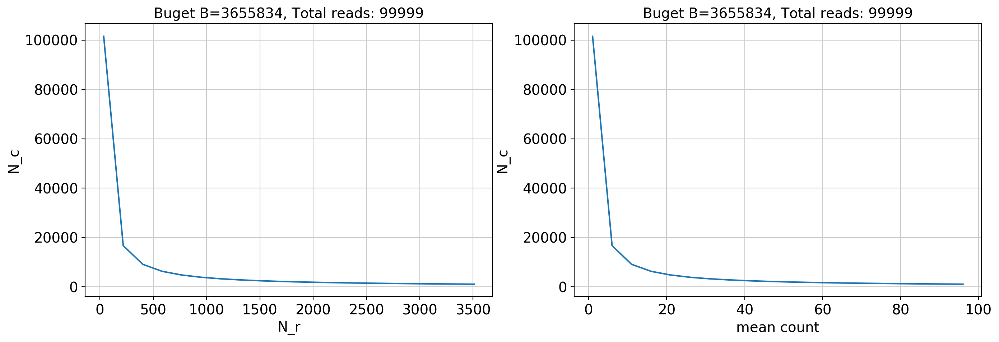

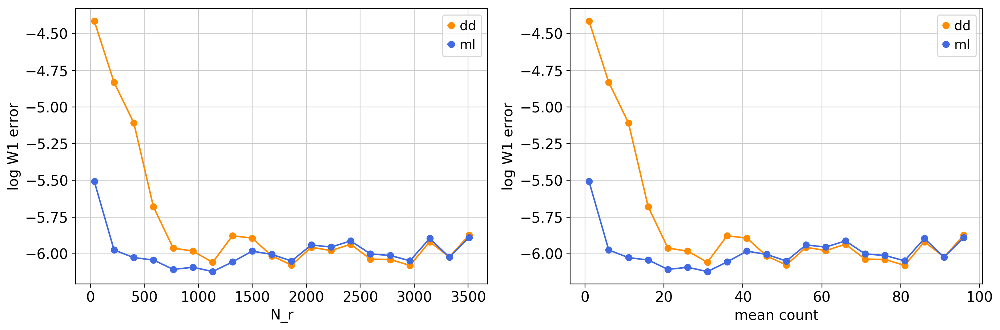

-------------------------------------------------------------------------
GZMB
Average counts per cell = 0.46116215248777


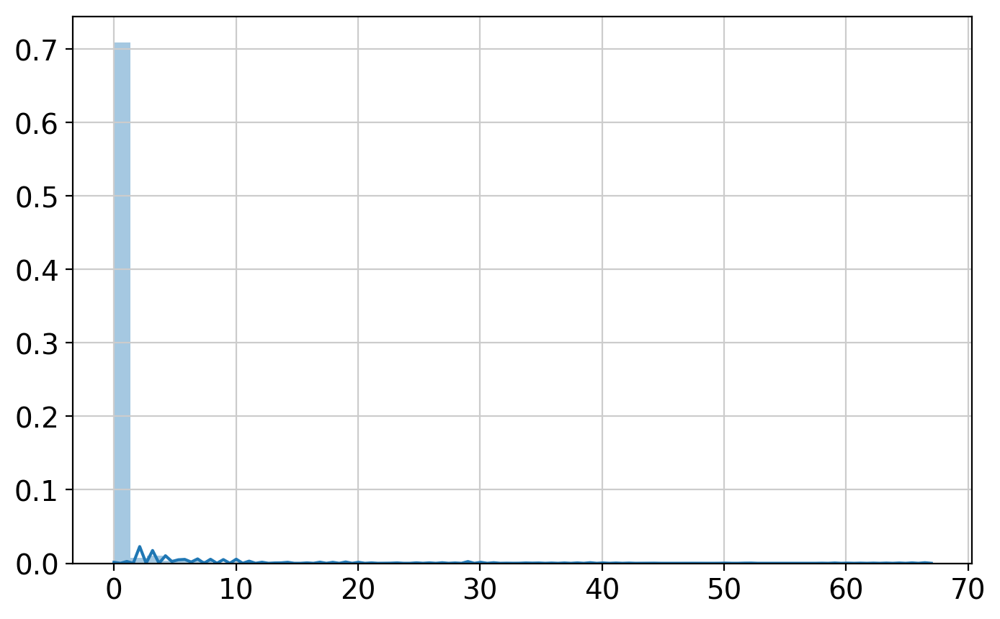

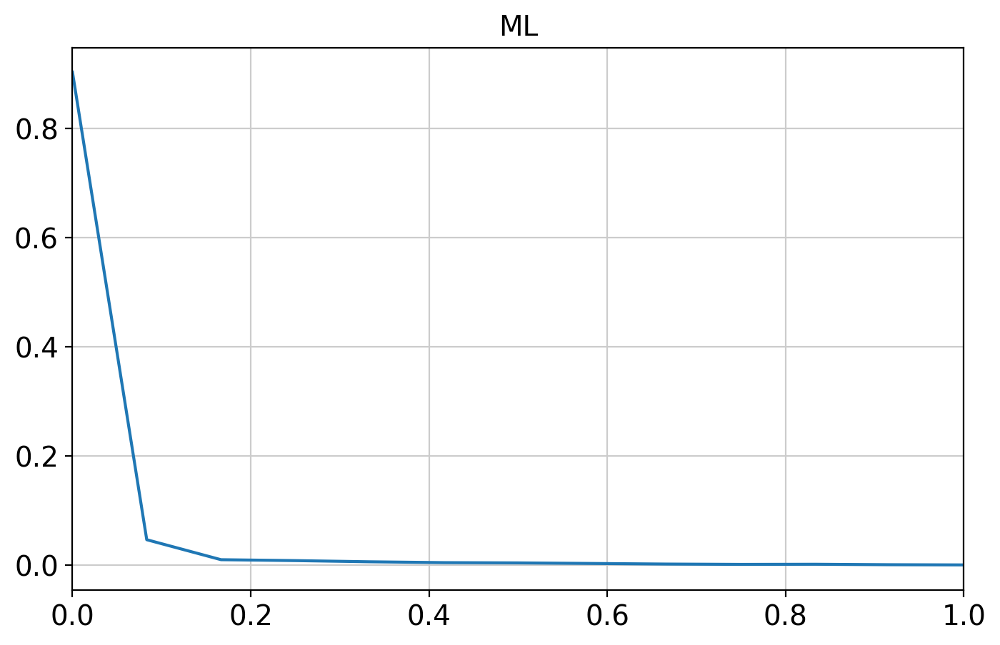

n_degree: 5, c_res: 2, c_reg: 1e-05, gamma: 12

### debug: proportion separation ### start ###


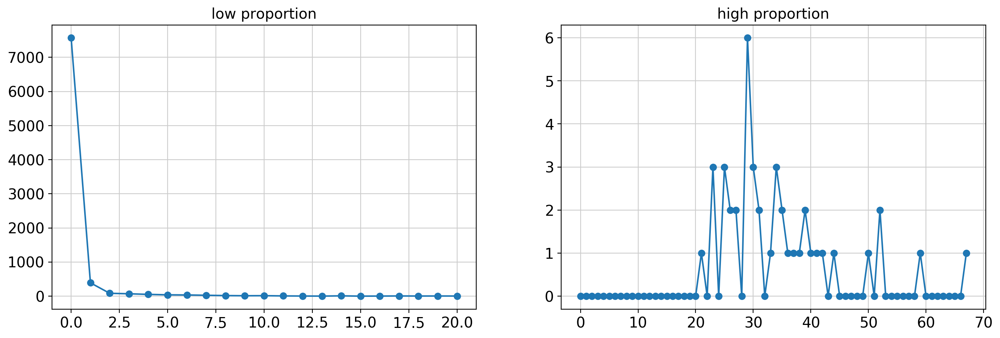

### debug: proportion separation ### end ###

### debug: proportion separation ### start ###
Numerical gradients
0.4930881130071896
0.04239517759074829
-0.18040551097442403
-0.2306836948129387
-0.12449414654724933
Close-form gradients
[ 0.49308811  0.04239518 -0.1804055  -0.23068367 -0.12449412]
### debug: proportion separation ### end ###

### debug: optimization ### start ###
c_reg 1e-05
-l:0.4812590178400309, reg:0.004253150390623237
### debug: optimization ### end ###

### debug: dd result before merging ### start ###
alpha_hat:  [  6.97639489 -10.5432526   12.5790503  -10.27860255   1.26593892]
gamma:12


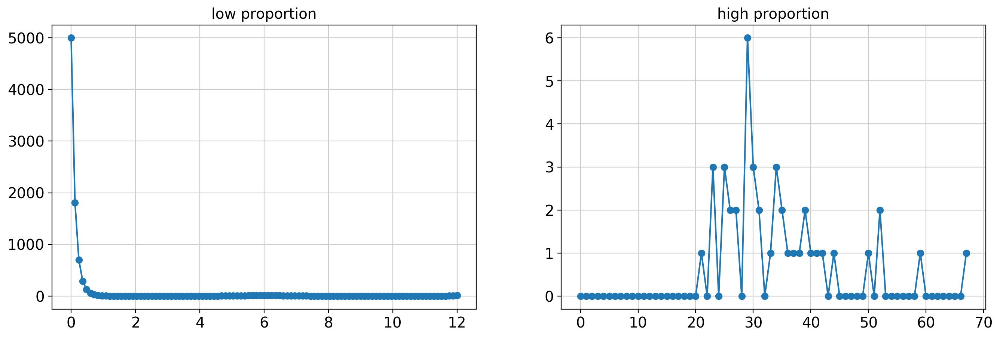

### debug: dd result before merging ### end ###

### debug: dd result after merging ### start ###
gamma:67.0


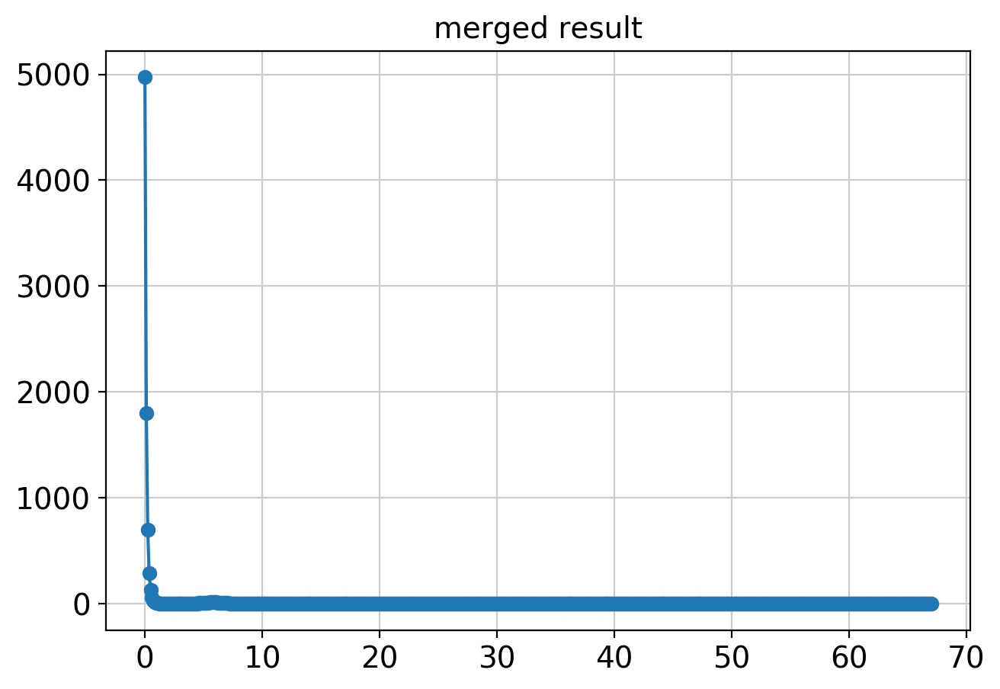

### debug: dd result after merging ### end ###

--- ccdf ---
>0.05: 3.810%
>0.1: 1.543%
>0.15: 0.894%
>0.2: 0.613%
>0.25: 0.533%
>0.3: 0.486%
>0.35: 0.425%
>0.4: 0.346%


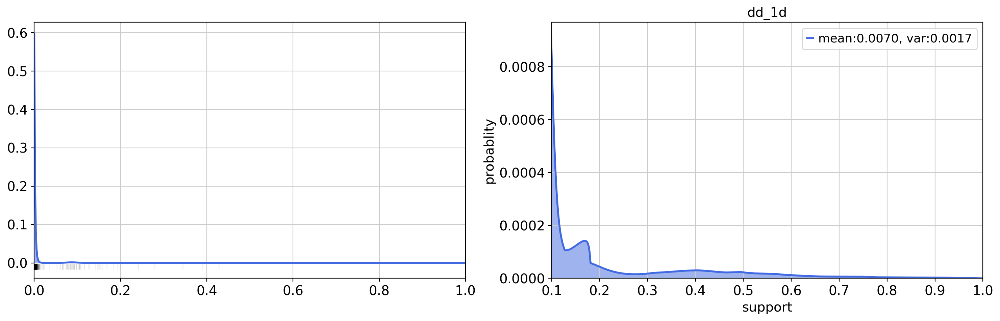

gamma: 67.0
### N_r=1452, mean_cts=9, N_c=10000


/home/martin/single_cell_eb/sc_deconv.py:303: RuntimeWarning: divide by zero encountered in double_scalars
  kernel_gaussian = 1/(np.sqrt(2*np.pi*temp_sigma**2))*np.exp(-(temp_x-x_new[i])**2/2/temp_sigma**2)


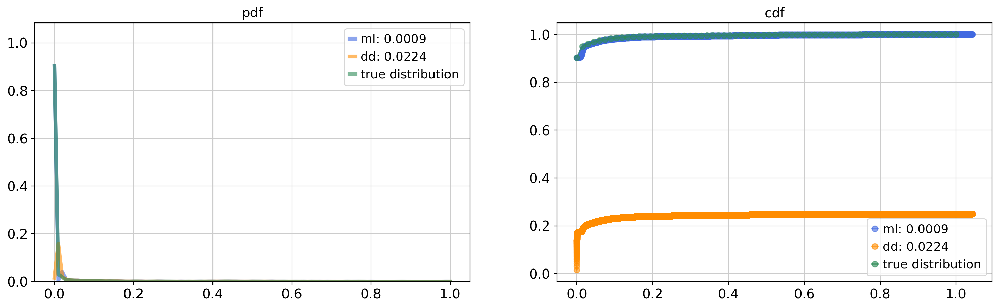



### N_r=14528, mean_cts=99, N_c=1000


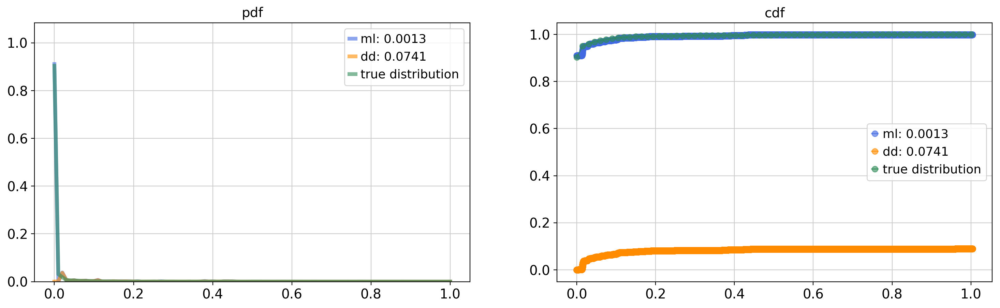

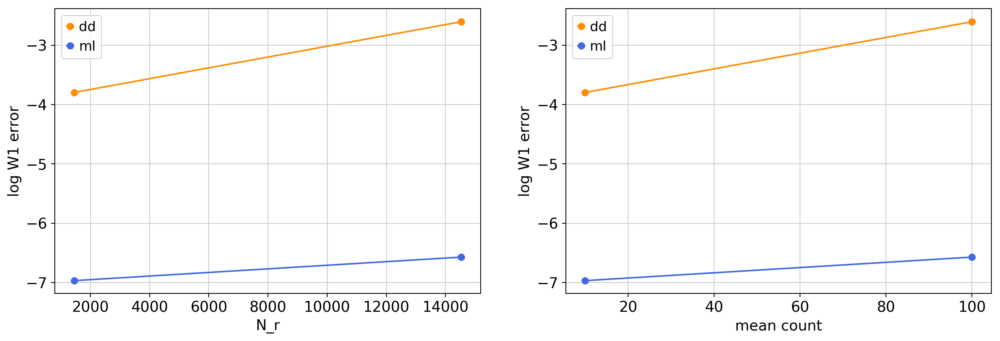

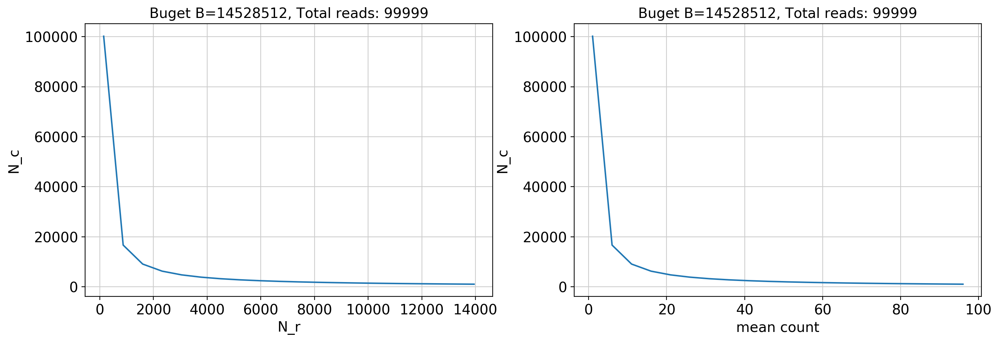

/home/martin/single_cell_eb/sc_deconv.py:303: RuntimeWarning: divide by zero encountered in double_scalars
  kernel_gaussian = 1/(np.sqrt(2*np.pi*temp_sigma**2))*np.exp(-(temp_x-x_new[i])**2/2/temp_sigma**2)
/home/martin/single_cell_eb/sc_deconv.py:303: RuntimeWarning: divide by zero encountered in double_scalars
  kernel_gaussian = 1/(np.sqrt(2*np.pi*temp_sigma**2))*np.exp(-(temp_x-x_new[i])**2/2/temp_sigma**2)
/home/martin/single_cell_eb/sc_deconv.py:303: RuntimeWarning: divide by zero encountered in double_scalars
  kernel_gaussian = 1/(np.sqrt(2*np.pi*temp_sigma**2))*np.exp(-(temp_x-x_new[i])**2/2/temp_sigma**2)
/home/martin/single_cell_eb/sc_deconv.py:303: RuntimeWarning: divide by zero encountered in double_scalars
  kernel_gaussian = 1/(np.sqrt(2*np.pi*temp_sigma**2))*np.exp(-(temp_x-x_new[i])**2/2/temp_sigma**2)
/home/martin/single_cell_eb/sc_deconv.py:303: RuntimeWarning: divide by zero encountered in double_scalars
  kernel_gaussian = 1/(np.sqrt(2*np.pi*temp_sigma**2))*np.exp

In [ ]:
for gene in genes:
    Y=np.array(adata[:,gene].X,dtype=int)
    print(gene)
    print("Average counts per cell =",np.sum(Y)/len(Y))
    plt.figure(figsize=[8,5])
    sns.distplot(Y)
    plt.show()
    plt.figure(figsize=[8,5])
    p_hat_ml,ml_info=ml_1d(Y)
    plt.plot(ml_info['x'],p_hat_ml)
    plt.xlim([0,1])
    plt.title('ML')
    plt.show()

    p_hat,dd_info=dd_1d(Y,noise='poi',verbose=1,gamma=None,debug_mode=True)
    print("gamma:",dd_info['gamma'])
    
    p_gene,x_gene = counts2pdf_1d(Y)
    x_gene = x_gene/x_gene.max()
    comparison_1d(p_gene,x_gene,1e5,mean_cts=[10,100],zero_inflate=True)
    tradeoff_1d(p_gene,x_gene,1e5)
    print("-------------------------------------------------------------------------")

In [ ]:
def plot_density_1d(p,x):
    M1,M2 = moments(p,x)
    plt.figure(figsize=[8,5])
    plt.plot(x,p,marker='.',lw=2,markersize=0,color="royalblue",label='mean:%s, var:%s'%(str(M1)[0:6],str(M2-M1**2)[0:6]))
    plt.fill_between(x, p, facecolor='royalblue', alpha=0.5)
    plt.xlim([0,1])
    plt.ylim([0,1.05*np.max(p)])
    
    
#     plt.bar(x,p,label='mean:%s, var:%s'%(str(M1)[0:6],str(M2-M1**2)[0:6]))
    

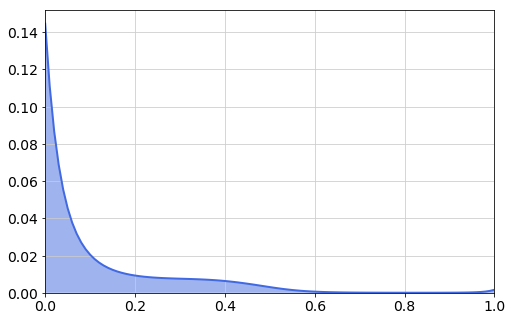

In [218]:
plot_density_1d(p_hat,dd_info['x'])